# SEMANTIC SEGMENTATION AND ANOMALY DETECTION ON ROADS

Machine Learning for Computer Vision 2025/2026

- Author: Miguel Fernández Lara





## 1. PROJECT SETTING

Nowadays, the vast majority of segmentation problems explored are based on closed sets, which means that the classes into which the pixels need to be classified are fixed and known. However, there are certain settings, such as the case of traffic detection, where there can be unexpected objects. Therefore, this now turns into an open set problem, in which the model needs to be able to handle unexpected objects, which will be called anomalies.


The goal of the project is to work with the StreetHazards Dataset [[Hendrycks et al., ICML 2022](https://arxiv.org/abs/1911.11132)] to explore different segmentation models and then analyse their performance in anomaly detection.

The dataset contains the following images:

- 5,125 training images
- 1,031 validation images  
- 1,500 test images


The classes are the following:

- 12 closed-set classes: `building``building`, `fence`, `other`, `pedestrian`, `pole`, `road line`, `road`, `sidewalk`, `vegetation`, `car`, `wall`, and `traffic sign`
- 1 unlabeled class. We treat class 0 (unlabeled) as background
- 1 anomaly class on test set: unexpected objects (anomalies) like animals, foreign objects, unusual vehicles, debris...

For the semantic segmentation problem and later anomaly detection, six approaches will be explored:
- Baseline model: Naive majority class model
- FCN + Resnet50
- FCN + Resnet50 + Focal Loss
- U-Net
- DeepLabV3+
- SegFormer

In order to run this notebook, Google Collab will be used. Therefore, the images must be inside drive. In the setup block, one can find the google drive connection, just change the root path of the images folder to run the notebook.

## 2. SETUP

Disallow training to evaluate the models

In [1]:
training = False

The first thing to do is install and import the necessary packages and libraries

In [2]:
!pip install -q segmentation-models-pytorch
import segmentation_models_pytorch as smp



   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 10.6 MB/s eta 0:00:00


In [ ]:
pip install transformers accelerate


In [4]:
from transformers import SegformerForSemanticSegmentation

In [5]:
import matplotlib.pyplot as plt

from PIL import Image
import numpy as np
import json
import os
import random
from tqdm import tqdm

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader, Subset
import torchvision
from torchvision.models.segmentation import deeplabv3_resnet50
from segmentation_models_pytorch.losses import FocalLoss


import albumentations as A
from albumentations.pytorch import ToTensorV2


from sklearn.metrics import average_precision_score


Google Drive connection

In [6]:
# Load the data from Google Drive
from google.colab import drive
drive.mount('/content/drive')


root = "/content/drive/MyDrive/ML_datasets/train"

ANNOTATIONS_FOLDER = "/content/drive/MyDrive/ML_datasets/train/annotations/training/t1-3"
IMAGES_FOLDER = "/content/drive/MyDrive/ML_datasets/train/images/training/t1-3"

TEST_ANNOTATIONS_FOLDER = "/content/drive/MyDrive/ML_datasets/test/annotations/test/t5"
TEST_IMAGES_FOLDER = "/content/drive/MyDrive/ML_datasets/test/images/test/t5"

root_models = "/content/drive/MyDrive/ML_datasets/train/models"
root_test = "/content/drive/MyDrive/ML_datasets/test"

Mounted at /content/drive


Configuration of the GPU

In [7]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [8]:
device

device(type='cuda')

Setting seed for reproducible results.

In [ ]:
random.seed(42)
torch.manual_seed(42)
np.random.seed(42)

## 3. DATASET LOADING AND EXPLORATION

In order to load the dataset, the images and masks must be in the correct path. Furthermore, one must notice that the possible classes for the masks go from 1-14 (12 closed set classes, 1 anomaly class and 1 unlabeled class), therefore we will change the indices to match the original classes described in the guidelines, from 0-13. Note that there are no anomaly class objects in the training set but the class is included.

In [9]:
class StreetHazardsDataset(Dataset):
    def __init__(self, odgt_path, root_dir="", transforms=None):
        self.transforms = transforms
        self.root_dir = root_dir
        self.data = []

        with open(odgt_path, "r") as f:
            for line in f:
                objs = json.loads(line.strip())
                self.data.extend(objs)

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        item = self.data[idx]

        img_path = os.path.join(self.root_dir, item["fpath_img"])
        mask_path = os.path.join(self.root_dir, item["fpath_segm"])

        img = Image.open(img_path).convert("RGB")
        mask = Image.open(mask_path)

        img = np.array(img)
        mask = np.array(mask).astype(np.int64)

        # Important: convert 1–14: 0–13
        mask = mask - 1
        mask[mask < 0] = 0  # just for safety

        if self.transforms:
            transformed = self.transforms(image=img, mask=mask)
            img = transformed["image"]
            mask = transformed["mask"]

        img = torch.tensor(img.transpose(2,0,1)).float() / 255.
        mask = torch.tensor(mask).long()

        return img, mask


Load the training data without transformations to visualize and perform EDA.

In [10]:
data_no_transform = StreetHazardsDataset(
    odgt_path=f"{root}/train.odgt",
    root_dir=root
)


Since I will be working in Google Collab and the GPU is quite limited, I will take a subset of the data for the analysis to be able to perform the study.

In [11]:
# Choosing n random indices
data_indices = random.sample(range(len(data_no_transform)), 1000)

data_no_transform = Subset(data_no_transform, data_indices)

A few insights about the dataset:
- We are working with RGB images
- The images have size 720 x 1280
- The labels in the mask are represented as a tensor


In [12]:
print("Dataset size:", len(data_no_transform))

img, mask = data_no_transform[56]

print("Image shape:", img.shape)      # expected (3,H,W)
print("Mask shape:", mask.shape)      # expected (H,W)
print("Image dtype:", img.dtype)
print("Mask dtype:", mask.dtype)

print("Unique labels in mask:", torch.unique(mask))


Dataset size: 1000
Image shape: torch.Size([3, 720, 1280])
Mask shape: torch.Size([720, 1280])
Image dtype: torch.float32
Mask dtype: torch.int64
Unique labels in mask: tensor([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])


As an example, the image below shows one of the images in the dataset with its corresponding mask

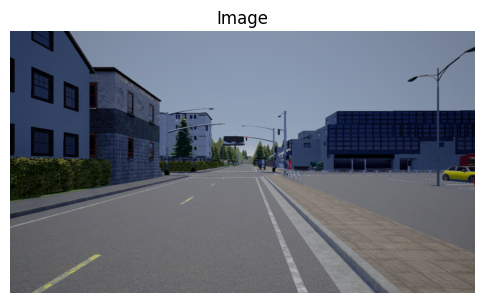

In [13]:
plt.figure(figsize=(6,6))
img_np = img.permute(1, 2, 0).cpu().numpy()   # (H, W, 3)
plt.imshow(img_np)
plt.title("Image")
plt.axis("off")
plt.show()


Below one can observe the annotations of the ground truths for the different classes. The color code was given in the guidelines. Here we observe that there is an anomaly class but, I insist, in the training images there will be zero anomalies.


/tmp/ipython-input-1009605232.py:31: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  return Image.fromarray(img_new.astype("uint8"), "RGB")


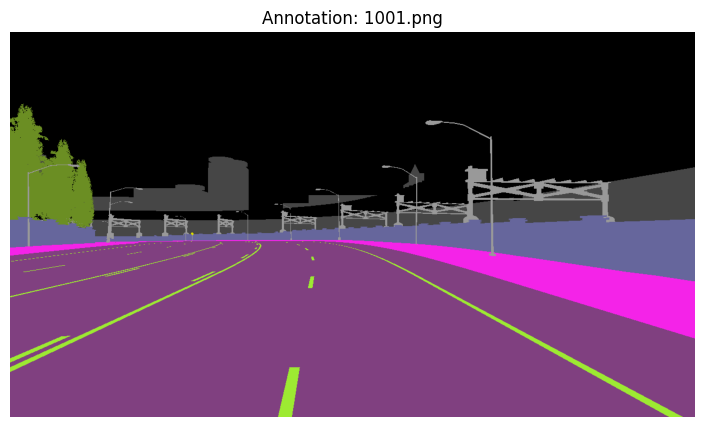

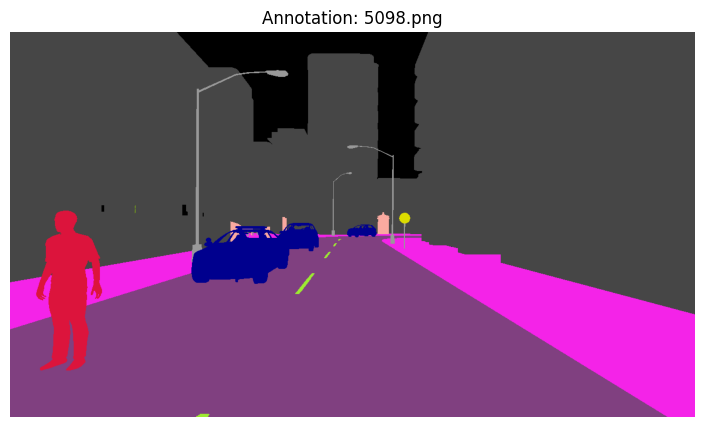

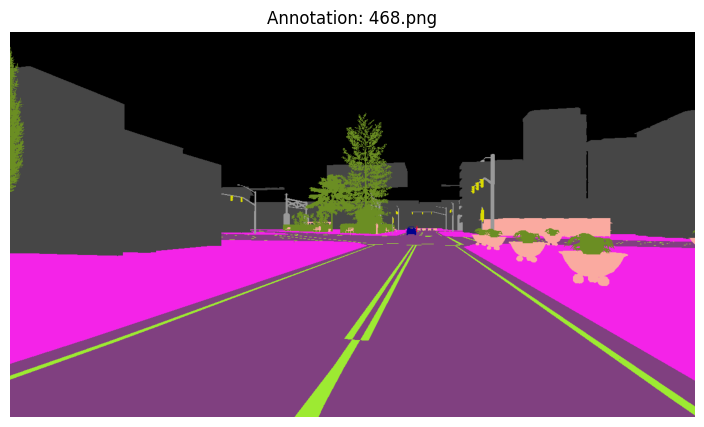

In [14]:
"""
Source: https://github.com/hendrycks/anomaly-seg/issues/15#issuecomment-890300278
"""

COLORS = np.array([
    [  0,   0,   0],  # unlabeled    =   0,
    [ 70,  70,  70],  # building     =   1,
    [190, 153, 153],  # fence        =   2,
    [250, 170, 160],  # other        =   3,
    [220,  20,  60],  # pedestrian   =   4,
    [153, 153, 153],  # pole         =   5,
    [157, 234,  50],  # road line    =   6,
    [128,  64, 128],  # road         =   7,
    [244,  35, 232],  # sidewalk     =   8,
    [107, 142,  35],  # vegetation   =   9,
    [  0,   0, 142],  # car          =  10,
    [102, 102, 156],  # wall         =  11,
    [220, 220,   0],  # traffic sign =  12,
    [ 60, 250, 240],  # anomaly      =  13,
])


def color(annot_path: str, colors: np.ndarray) -> Image.Image:
    img_pil = Image.open(annot_path)
    img_np = np.array(img_pil)
    img_new = np.zeros((720, 1280, 3))

    for index, color in enumerate(colors):
        img_new[img_np == index + 1] = color

    return Image.fromarray(img_new.astype("uint8"), "RGB")




files = [f for f in os.listdir(ANNOTATIONS_FOLDER) if f.endswith(".png")]

# Pick 3 random masks
for f in random.sample(files, 3):
    annot_path = os.path.join(ANNOTATIONS_FOLDER, f)

    colored = color(annot_path, COLORS)

    plt.figure(figsize=(10, 5))
    plt.title(f"Annotation: {f}")
    plt.imshow(colored)
    plt.axis("off")
    plt.show()

If we inspect the labels found in some random images, we can see that all 12 closed set classes + unlabeled class are present. However, the anomaly class is not present anytime, as it should.

In [15]:
N = 5  # number of random images to inspect

all_labels = set()

indices = random.sample(range(len(data_no_transform)), N)

for idx in indices:
    _, mask = data_no_transform[idx]
    mask = mask.to(device)
    unique = torch.unique(mask).tolist()
    all_labels.update(unique)

print(f"Unique labels found in {N} random images:", sorted(all_labels))
print("Number of unique labels:", len(all_labels))


Unique labels found in 5 random images: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12]
Number of unique labels: 13


Now the frequency of classes in the dataset will be observed.

In [16]:
observe_classes = False

In [17]:
if observe_classes:
  num_classes = 14
  class_counts = torch.zeros(num_classes, dtype=torch.long, device=device)

  N = len(data_no_transform)
  indices = random.sample(range(len(data_no_transform)), N)

  for i in tqdm(indices):
      _, mask = data_no_transform[i]  # mask: [H, W]

      # Move mask to GPU
      mask = mask.to(device)

      # Compute class frequencies on GPU
      values, counts = torch.unique(mask, return_counts=True)

      # Accumulate counts
      class_counts[values] += counts

  # Move results to CPU for printing
  class_counts_cpu = class_counts.cpu()

  print(f"Class pixel counts (random {N} images):")
  for c in range(num_classes):
      print(f"Class {c}: {class_counts_cpu[c].item()}")


If we create a bar plot out of the frequencies, one can observe that we are dealing with a highly unbalanced dataset. The majority class is class 7 (road), followed by class 0 (unlabeled) and class 9 (vegetation). On the other hand, we can barely find segmentations of classes 2 (fence), 4 (pedestrian) and 10 (car).

In [18]:
if observe_classes:
  # Convert tensor to numpy array
  counts = class_counts_cpu.numpy()

  plt.figure(figsize=(12,5))
  plt.bar(np.arange(num_classes), counts, color='skyblue')

  plt.xticks(np.arange(num_classes))
  plt.xlabel("Class ID")
  plt.ylabel("Pixel Count")
  plt.title(f"Class Pixel Distribution (First {N} Images)")
  plt.grid(axis='y', linestyle='--', alpha=0.5)

  plt.show()


Even though class 0 corresponds to unlabeled pixels, it will be included during training and treated as a background class. One must observe that this allows the network to learn the spatial extent of annotated semantic regions and improves boundary consistency between foreground classes. 
I must also address that unlabeled pixels represent a significant portion of the image and correspond to coherent background structures (sky or distant regions). Therefore, excluding them would discard useful contextual information.

The following function is crucial to identify the different segmentations individually. One can plug in a class id and some images will be displayed with the class highlighted in green. The rest of the classes will be grey.

In [19]:
def show_class_in_color(
    annot_folder: str,
    class_id: int,
    num_samples: int = 3,
    dim_factor: float = 1,   # how visible other classes are (0.0–1.0)
):
    """
    Shows one class highlighted in green and all other classes dimmed.
    Mask values are 0–13 after remapping in the dataset
    """

    files = [f for f in os.listdir(annot_folder) if f.endswith(".png")]
    chosen = random.sample(files, min(num_samples, len(files)))

    mask_value = class_id + 1  # shift for the dataset

    for f in chosen:
        mask = np.array(Image.open(os.path.join(annot_folder, f)))

        # Base visualization: full annotation but dimmed
        vis = (mask.astype(np.float32) / mask.max()) * 255
        vis = np.stack([vis, vis, vis], axis=-1)  # grayscale RGB
        vis = (vis * dim_factor).astype(np.uint8)  # dim it

        # Highlight selected class
        highlight = (mask == mask_value)

        # Make selected pixels green
        vis[highlight] = [127, 222, 168]

        plt.figure(figsize=(6, 4))
        plt.title(f"{f} — Highlighting class {class_id}")
        plt.imshow(vis)
        plt.axis("off")
        plt.show()


To understand what is the unlabeled class, we display a few images.

As one can observe, the 0 class is mainly background details such as the sky, fields and other large portions of image that mostly have the same uniform color and are not identified by any of the other classes.

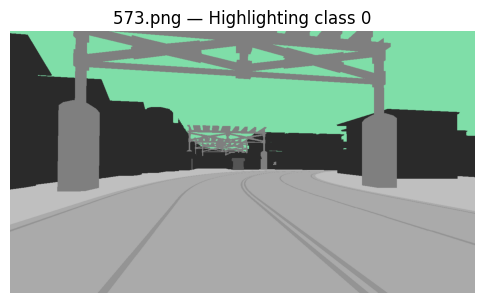

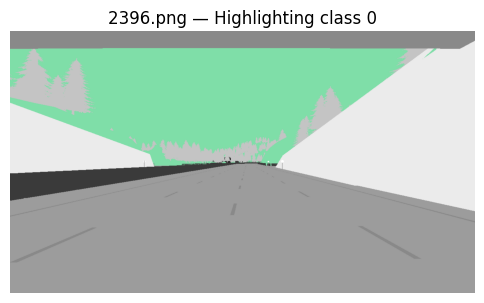

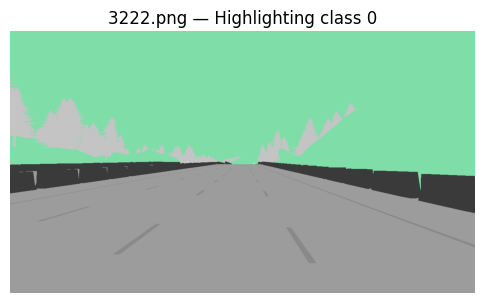

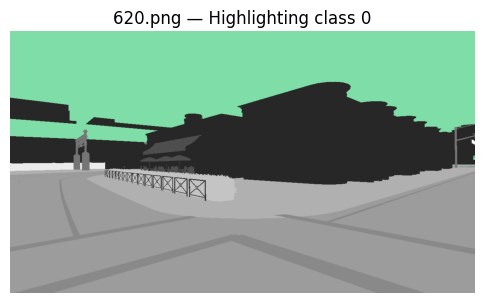

In [20]:
show_class_in_color(ANNOTATIONS_FOLDER, class_id=0, num_samples=4)

Another important feature we must observe is the alignment between the mask and the image. Therefore, the image below shows both the mask and image overlaped at a different rate (70% image and 30% mask). We can observe that they match perfectly.

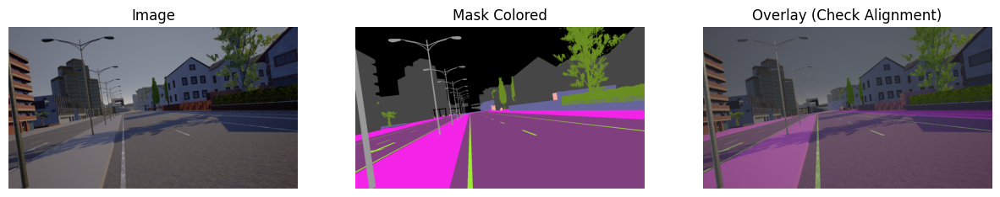

In [21]:
def colorize_mask(mask, colors):
    """Convert mask [H,W] into RGB color mask using COLORS array."""
    h, w = mask.shape
    mask_rgb = np.zeros((h, w, 3), dtype=np.uint8)
    for cls_id, color in enumerate(colors):
        mask_rgb[mask == cls_id] = color
    return mask_rgb

def show_overlay(dataset, idx, COLORS):
    img, mask = dataset[idx]

    img = img.permute(1,2,0).cpu().numpy()  # [H,W,3]
    mask_np = mask.cpu().numpy()

    mask_rgb = colorize_mask(mask_np, COLORS)

    # 70% image + 30% mask
    overlay = (0.7 * img + 0.3 * mask_rgb / 255).clip(0,1)

    plt.figure(figsize=(15,5))

    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_rgb)
    plt.title("Mask Colored")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(overlay)
    plt.title("Overlay (Check Alignment)")
    plt.axis("off")

    plt.show()

show_overlay(data_no_transform, idx=10, COLORS=COLORS)


## 4. DATA AUGMENTATION AND LOADERS

One of the most crucial things to do before training the models is to perform data augmentation techniques. Why is this crucial? If the model only sees:

- the same lighting

- same camera angles

- same object scales

- same weather

- same road textures

then it will not generalize to new scenes. We want the model to be prepared to every type of image, not just the ones given with the same characteristics.

Inside the albumentations library, there are some data augmentation posibilities that include weather effects. Therefore, I will explore them individually to observe the capabilities of these feature and how well they work in the images proposed. Note these are exploratory visualizations, final training uses a reduced pipeline.

In [22]:
def preview_weather_effect(img_path, transform):
    """Preview a weather effect on a single image."""
    img = np.array(Image.open(img_path).convert("RGB"))

    transformed = transform(image=img)
    aug_img = transformed["image"]

    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    plt.imshow(img)
    plt.title("Original")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(aug_img)
    plt.title("Weather Effect Preview")
    plt.axis("off")

    plt.show()

Fog:

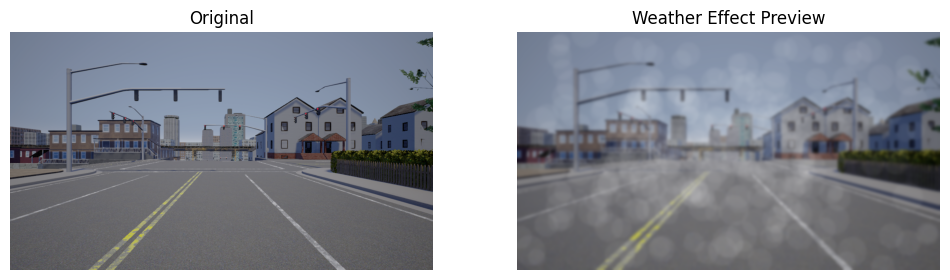

In [23]:
image_path = f"{IMAGES_FOLDER}/1.png"
weather_fog = A.Compose([A.RandomFog(p=1.0)])
preview_weather_effect(image_path, weather_fog)

Rain:

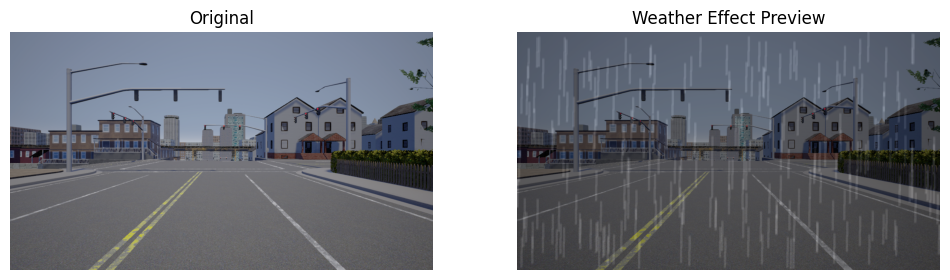

In [24]:
weather_rain = A.Compose([A.RandomRain(p=1.0)])
preview_weather_effect(image_path, weather_rain)


Shadow:

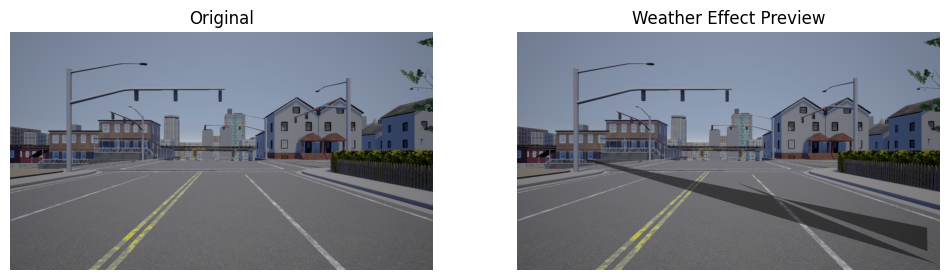

In [25]:
weather_shadow = A.Compose([A.RandomShadow(p=1.0)])
preview_weather_effect(image_path, weather_shadow)


Snow:

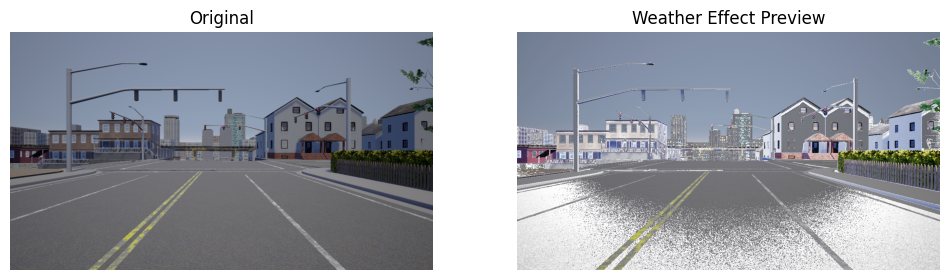

In [26]:
weather_snow = A.Compose([A.RandomSnow(p=1.0)])
preview_weather_effect(image_path, weather_snow)


Sun:

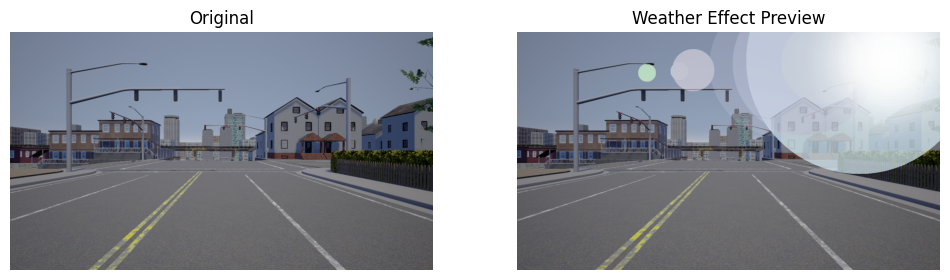

In [27]:
weather_sun = A.Compose([A.RandomSunFlare(p=1.0)])
preview_weather_effect(image_path, weather_sun)


Given the previous weather features, and others like cropping, resizing, flipping, blurring, coloring and geometric transforming, a complete pipeline is built in order to apply these transformations to the **training** images with some probability.

In [ ]:
train_transforms = A.Compose([
    # 1. Random crop AND resize for better rare class visibility
    A.RandomResizedCrop(
    size=(512, 512),
    scale=(0.5, 1.0),
    ratio=(0.75, 1.33),
    p=0.9
    ),

    # 2. Horizontal flip
    A.HorizontalFlip(p=0.5),

    # 3. Geometric transforms that DON'T break masks
    A.ShiftScaleRotate(
        shift_limit=0.05,
        scale_limit=0.1,
        rotate_limit=0,   # rotation disabled to avoid mask distortion
        border_mode=0,
        p=0.5
    ),

    # 4. Photometric augmentations (outdoor robustness)
    A.RandomBrightnessContrast(p=0.4),
    A.HueSaturationValue(p=0.3),
    A.RGBShift(p=0.2),

    # 5. Weather / atmospheric effects (helps anomaly robustness)
    A.RandomFog(p=0.1),
    A.RandomRain(p=0.1),
    A.RandomShadow(p=0.2),
    A.RandomSnow(p=0.05),
    A.RandomSunFlare(p=0.05),

    # 6. Blur / noise
    A.GaussianBlur(p=0.1),
    A.GaussNoise(p=0.2),

    # 7. Resize to final size (after all transforms)
    A.Resize(512, 512),
])


val_transforms = A.Compose([
    A.Resize(512, 512),
])


Given that the processing of the transformations for such a huge amount of images is slow and infeasible for the Google Colab GPU, I propose a lighter transformation to not overload the processing and further training of the models. Feel free to use the previous pipeline if the GPU available is powerful.

In [29]:
train_transforms = A.Compose([
    A.RandomResizedCrop(size=(512,512), scale=(0.8,1.0), p=0.8),
    A.HorizontalFlip(p=0.5),
    A.RandomBrightnessContrast(p=0.3),
    A.Resize(512,512),
])

val_transforms = A.Compose([
    A.Resize(512, 512),
])

Now the train and validation sets are created. Again, we use a small subset of the data due to GPU limitations.

In [30]:
train_set = StreetHazardsDataset(
    odgt_path=f"{root}/train.odgt",
    root_dir=root,
    transforms=train_transforms
)

val_set = StreetHazardsDataset(
    odgt_path=f"{root}/validation.odgt",
    root_dir=root,
    transforms=val_transforms
)

In [31]:
train_indices = random.sample(range(len(train_set)), 1000)
val_indices   = random.sample(range(len(val_set)), 600)

# Create smaller subsets
train_small = Subset(train_set, train_indices)
val_small   = Subset(val_set, val_indices)


The following chunk creates the data loaders for both training and validation. The batch size and number of workers can be changed depending on GPU capabilities.

In [32]:
batch_size = 8
num_workers = 2

train_loader = DataLoader(
    train_small,
    batch_size=batch_size,
    shuffle=True,
    num_workers=num_workers,
    pin_memory=True
)

val_loader = DataLoader(
    val_small,
    batch_size=batch_size,
    shuffle=False,
    num_workers=num_workers,
    pin_memory=True
)


Quick check of the shape of the images and mask, along with the classes ids


In [33]:
imgs, masks = next(iter(train_loader))
print(imgs.shape)   # [B, 3, 512, 512]
print(masks.shape)  # [B, 512, 512]
print(masks.min(), masks.max())


torch.Size([8, 3, 512, 512])
torch.Size([8, 512, 512])
tensor(0) tensor(12)


Now that we are working with data loaders, we create a now function to color the masks

In [34]:
def colorize_mask(mask_np, colors):
    """
    mask_np: numpy array [H, W] with class IDs 0–13
    colors : COLORS array
    """
    h, w = mask_np.shape
    img_new = np.zeros((h, w, 3), dtype=np.uint8)

    for class_id, color in enumerate(colors):
        img_new[mask_np == class_id] = color

    return img_new


I will now plot the original image with the colored mask using two color palettes: tab20 and the proposed in the guidelines

In [35]:
def show_augmented_batch(loader, COLORS, n=4):
    imgs, masks = next(iter(loader))   # load a batch

    for i in range(min(n, imgs.size(0))):
        img = imgs[i].permute(1,2,0).cpu().numpy()
        mask = masks[i].cpu().numpy()

        mask_rgb = colorize_mask(mask, COLORS)

        plt.figure(figsize=(14,4))

        # Augmented RGB image
        plt.subplot(1,3,1)
        plt.imshow(img)
        plt.title("Augmented Image")
        plt.axis("off")

        # Raw mask
        plt.subplot(1,3,2)
        plt.imshow(mask, cmap="tab20")
        plt.title("Mask IDs")
        plt.axis("off")

        # Colored mask
        plt.subplot(1,3,3)
        plt.imshow(mask_rgb)
        plt.title("Mask (Colored)")
        plt.axis("off")

        plt.show()


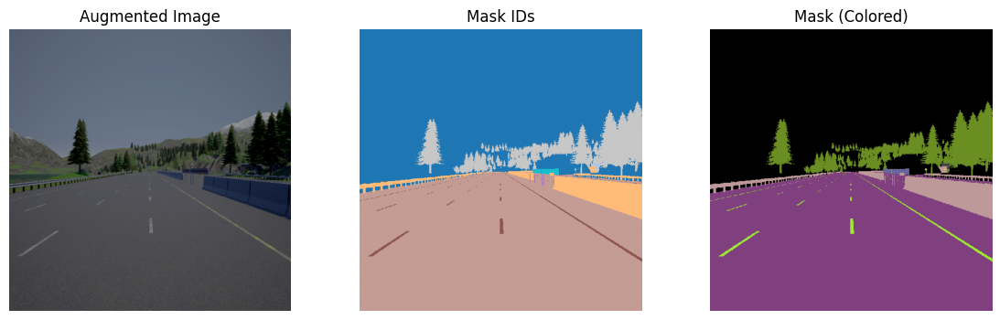

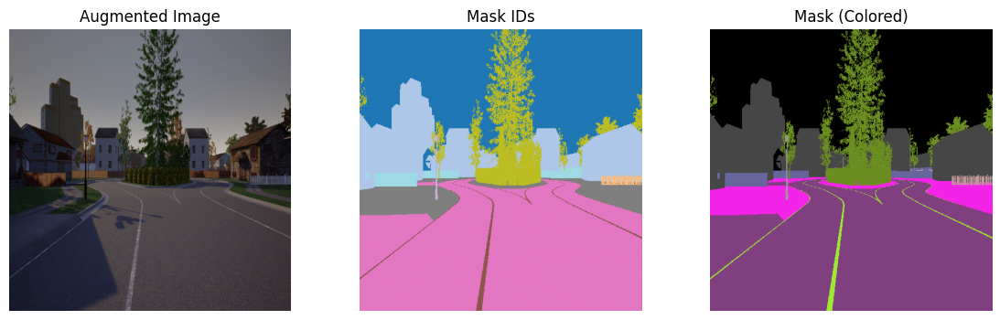

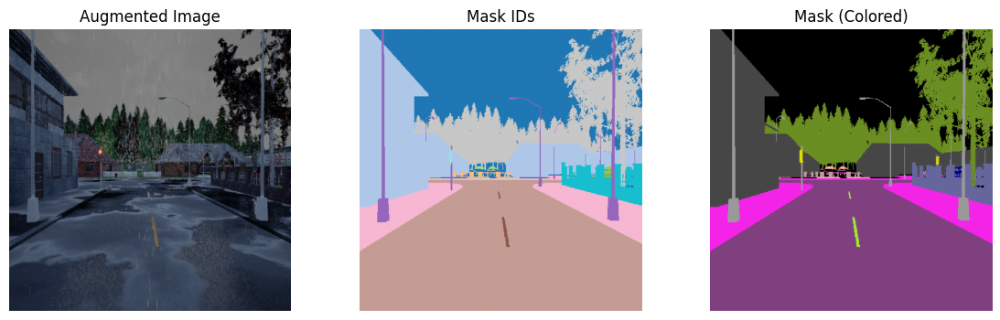

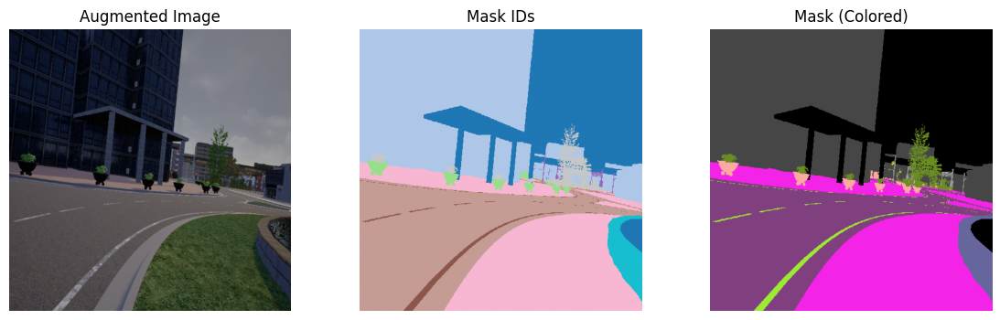

In [36]:
show_augmented_batch(train_loader, COLORS, n=4)


## 5. SEMANTIC SEGMENTATION (CLOSED-SET)


The aim of this part is to classify correctly each of the pixels inside the images, corresponding to one of the 13 classes proposed (we don't take into account the anomaly class).

First I will display the common functions that will be later used for visualization and computation of metrics once the models are trained.

Visualize the prediction masks:

In [37]:
def visualize_prediction(img, mask, pred, COLORS):
    img = img.permute(1,2,0).cpu().numpy()
    mask_rgb = colorize_mask(mask.cpu().numpy(), COLORS)
    pred_rgb = colorize_mask(pred.cpu().numpy(), COLORS)

    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(img)
    plt.title("Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_rgb)
    plt.title("Ground Truth")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_rgb)
    plt.title("Prediction")
    plt.axis("off")

    plt.show()


Compute the IoU per class:

In [38]:
def compute_iou(pred, target, num_classes=14):
    ious = []

    pred = pred.view(-1)
    target = target.view(-1)

    for cls in range(num_classes):
        pred_inds = (pred == cls)
        target_inds = (target == cls)

        intersection = (pred_inds & target_inds).sum().item()
        union = (pred_inds | target_inds).sum().item()

        if union == 0:
            ious.append(float("nan"))
        else:
            ious.append(intersection / union)

    return ious


Compute the confussion matrix:

In [39]:
def compute_confusion_matrix(model, loader, num_classes=14, device="cuda"):
    model.eval()
    cm = torch.zeros(num_classes, num_classes, dtype=torch.long, device=device)

    with torch.no_grad():
        for imgs, masks in loader:
            imgs = imgs.to(device)
            masks = masks.to(device)

            preds = model(imgs)["out"].argmax(1)

            preds = preds.view(-1)
            masks = masks.view(-1)

            valid = (masks >= 0) & (masks < num_classes)

            inds = num_classes * masks[valid] + preds[valid]

            # IMPORTANT: bincount returns CPU unless inds is on GPU
            bc = torch.bincount(inds, minlength=num_classes**2)

            # Move bc to GPU and reshape
            bc = bc.to(device).reshape(num_classes, num_classes)

            cm += bc

    return cm





Computing the IoUs from the Confussion Matrix:

In [40]:
def compute_ious_from_cm(cm):
    cm = cm.cpu().numpy()
    num_classes = cm.shape[0]

    ious = []
    for c in range(num_classes):
        tp = cm[c, c]
        fp = cm[:, c].sum() - tp
        fn = cm[c, :].sum() - tp
        denom = tp + fp + fn

        if denom == 0:
            ious.append(float("nan"))
        else:
            ious.append(tp / denom)

    return np.array(ious)



### 5.1 BASELINE: Naive Majority Class Segmentator

The first model to be tested will serve as a baseline for the rest of the models. A very simple naive approach will be performed. It will just take the majority class and assign all classifications to that class. Note that it inspects image by image and it takes a while to compute the majority class. The naive baseline predicts the most frequent class for all pixels.

In [ ]:
majority_class = False

In [ ]:
def compute_majority_class(loader, num_classes=14):
    counts = torch.zeros(num_classes, dtype=torch.long)

    for _, masks in loader:
        # masks: [B, H, W]
        flat = masks.view(-1)
        valid = (flat >= 0) & (flat < num_classes)
        binc = torch.bincount(flat[valid], minlength=num_classes)
        counts += binc

    majority_class = torch.argmax(counts).item()
    print("Majority class:", majority_class)
    return majority_class


As we saw before, the majority class is 7.

In [ ]:
if majority_class:
  majority_class = compute_majority_class(train_loader, num_classes=14)


Majority class: 7


We predict the pixels by assigning the majority class.

In [ ]:
def majority_baseline_predict(loader, majority_class, device="cpu"):
    preds_list = []
    gts_list = []

    for imgs, masks in loader:
        B, _, H, W = imgs.shape

        # Predict the majority class everywhere
        preds = torch.full((B, H, W), majority_class, device=device)
        preds_list.append(preds.cpu())

        gts_list.append(masks.cpu())

    preds = torch.cat(preds_list)
    gts   = torch.cat(gts_list)
    return preds, gts


Compute the confusion matrix. I will not display it since this is just the baseline model

In [ ]:
def compute_cm_from_preds_gts(preds, gts, num_classes=14):
    cm = torch.zeros(num_classes, num_classes, dtype=torch.long)

    preds = preds.view(-1)
    gts = gts.view(-1)

    valid = (gts >= 0) & (gts < num_classes)

    inds = num_classes * gts[valid] + preds[valid]

    bc = torch.bincount(inds, minlength=num_classes**2)
    return bc.reshape(num_classes, num_classes)


Computing the mIoU.
We get a performing mIoU of around 0.02. This can be easily improved with the models that I will be presenting next.

In [ ]:
if majority_class:
  preds, gts = majority_baseline_predict(val_loader, majority_class)

  cm_majority = compute_cm_from_preds_gts(preds, gts, num_classes=14)
  ious_majority = compute_ious_from_cm(cm_majority)
  miou_majority = np.nanmean(ious_majority)

  print("Majority Baseline mIoU:", miou_majority)


### 5.2 FCN + Resnet50

The motivation to use FCN to compute the segmentation of the objects is to implement one of the first models created for this task. It replaces fully connected layers with convolutional layers for dense prediction. It can actually take arbitrary image sizes.

The FCN will use a standard ResNet50 backbone and adds a 1x1 convolution to map features into class scores. It also produces a coarse feature map, which is downsampled.

The main idea that was introduced to help with the problem of resolution loss due to stride was upsampling by adding transposed convolutions.

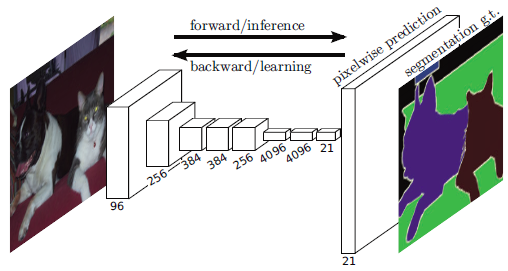

The first actual segmentation model to explore is FCN using a ResNet50 backbone. I will be using the pretrained weights to save computational cost and I will model the head to make a 14 class prediction (including the unlabeled and anomaly class, even though we don't expect any anomaly labels).


In [ ]:
# Loading the pretrained ResNet50 backbone

model = torchvision.models.segmentation.fcn_resnet50(
    weights=torchvision.models.segmentation.FCN_ResNet50_Weights.DEFAULT
)

Downloading: "https://download.pytorch.org/models/fcn_resnet50_coco-1167a1af.pth" to /root/.cache/torch/hub/checkpoints/fcn_resnet50_coco-1167a1af.pth


100%|██████████| 135M/135M [00:03<00:00, 44.5MB/s]


Since we are fine tuning the model, we need to modify the last layers (classifier) to adjust is to the specific problem to be solved. In this case, we need 14 output classes.

In [ ]:
# Replace heads with 14-class outputs
model.classifier[4] = nn.Conv2d(512, 14, kernel_size=1)
model.aux_classifier[4] = nn.Conv2d(256, 14, kernel_size=1)

model = model.to(device)

The loss criterion used is Cross Entropy Loss. In the case of the optimizer, Adam is used since it has been proven to be one of the most efficient ones.

In [ ]:
# Defining the loss, optimizer and scheduler

criterion = nn.CrossEntropyLoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

# I define the training function for one epoch

def train_one_epoch(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0

    for imgs, masks in tqdm(loader, desc="Training", leave=False):
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(imgs)["out"]
        loss = criterion(outputs, masks)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)





Now I set the model to evaluation mode and return the loss

In [ ]:
# Defining the validation function

def validate(model, loader, criterion, device):
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for imgs, masks in tqdm(loader, desc="Validating", leave=False):
            imgs = imgs.to(device)
            masks = masks.to(device)

            outputs = model(imgs)["out"]
            loss = criterion(outputs, masks)

            total_loss += loss.item()

    return total_loss / len(loader)

In order to overcome overfitting, early stopping will be used. However, since the number of epochs chosen is quite low (10), due to GPU limitations, early stopping is not expected to be triggered

In [ ]:
if training:

  # Training loop with early stopping

  best_val_loss = float("inf")
  num_epochs = 10

  # Early stopping settings
  patience = 3
  no_improve_epochs = 0

  # Track losses for plotting
  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):
      print(f"\nEPOCH {epoch+1}/{num_epochs}")

      train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
      val_loss   = validate(model, val_loader, criterion, device)

      scheduler.step()

      print(f"Train Loss: {train_loss:.4f}")
      print(f"Val Loss:   {val_loss:.4f}")

      # Save losses
      train_losses.append(train_loss)
      val_losses.append(val_loss)

      # Save latest model
      torch.save(model.state_dict(), f"{root_models}/fcn_latest.pt")

      # Save best model
      if val_loss < best_val_loss:
          best_val_loss = val_loss
          torch.save(model.state_dict(), f"{root_models}/fcn_best.pt")
          print("Best FCN model saved")
          no_improve_epochs = 0
      else:
          no_improve_epochs += 1
          print(f"No improvement for {no_improve_epochs} epoch(s).")

      # EARLY STOPPING
      if no_improve_epochs >= patience:
          print("\nEarly stopping triggered.")
          break


  torch.save(model.state_dict(), f"{root_models}/fcn_final.pt")

  print("\nTraining complete. Saved fcn_latest.pt, fcn_best.pt, fcn_final.pt")




EPOCH 1/10


Train Loss: 0.6927
Val Loss:   0.5363
Best FCN model saved

EPOCH 2/10


Train Loss: 0.3174
Val Loss:   0.4486
Best FCN model saved

EPOCH 3/10


Train Loss: 0.2274
Val Loss:   0.3817
Best FCN model saved

EPOCH 4/10


Train Loss: 0.1862
Val Loss:   0.3966
No improvement for 1 epoch(s).

EPOCH 5/10


Train Loss: 0.1700
Val Loss:   0.4045
No improvement for 2 epoch(s).

EPOCH 6/10


Train Loss: 0.1397
Val Loss:   0.3667
Best FCN model saved

EPOCH 7/10


Train Loss: 0.1282
Val Loss:   0.3773
No improvement for 1 epoch(s).

EPOCH 8/10


Train Loss: 0.1207
Val Loss:   0.3808
No improvement for 2 epoch(s).

EPOCH 9/10


Train Loss: 0.1164
Val Loss:   0.3731
No improvement for 3 epoch(s).

Early stopping triggered.

Training complete. Saved fcn_latest.pt, fcn_best.pt, fcn_final.pt


In the plot below we can observe the training and validation losses. One cannot observe overfitting.

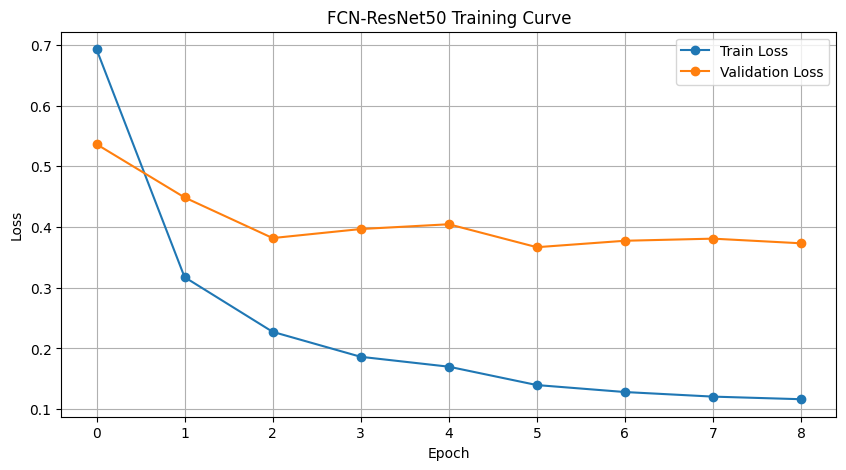

In [ ]:
if training:
  plt.figure(figsize=(10,5))
  plt.plot(train_losses, label="Train Loss", marker='o')
  plt.plot(val_losses, label="Validation Loss", marker='o')
  plt.title("FCN-ResNet50 Training Curve")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.grid(True)
  plt.legend()
  plt.show()

Loading the model for testing

In [ ]:
model = torchvision.models.segmentation.fcn_resnet50(
    weights=None,
    aux_loss=True   # Forcing the auxiliary classifier to be built
)


# Modify classifier for 14 classes
model.classifier[4] = nn.Conv2d(512, 14, kernel_size=1)
model.aux_classifier[4] = nn.Conv2d(256, 14, kernel_size=1)

model = model.to(device)

for p in model.backbone.parameters():
    p.requires_grad = False

print("FCN model architecture rebuilt")


# Loading the model from the root path

checkpoint_path = f"{root_models}/fcn_best.pt"

state = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(state)

model.eval()
print("FCN weights loaded correctly")

FCN model architecture rebuilt.
FCN weights loaded correctly.


The predictions made by this first model look like this:

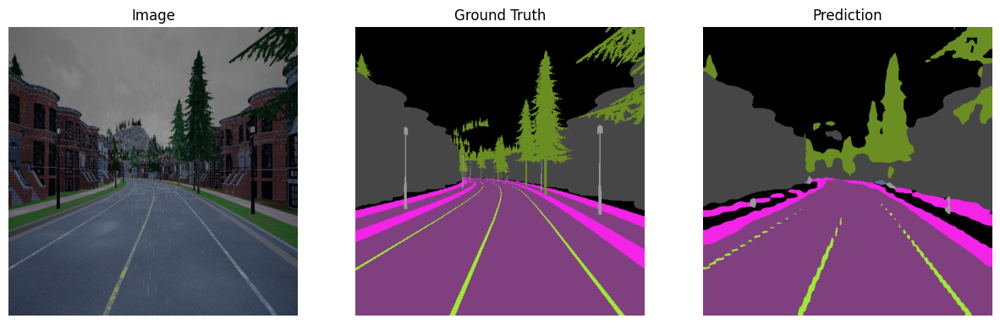

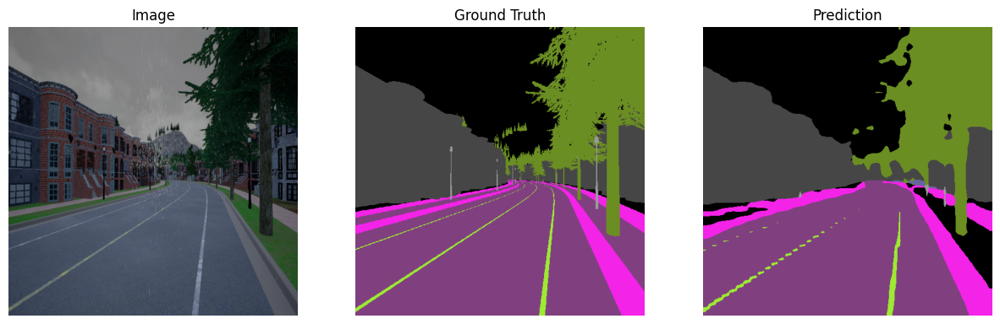

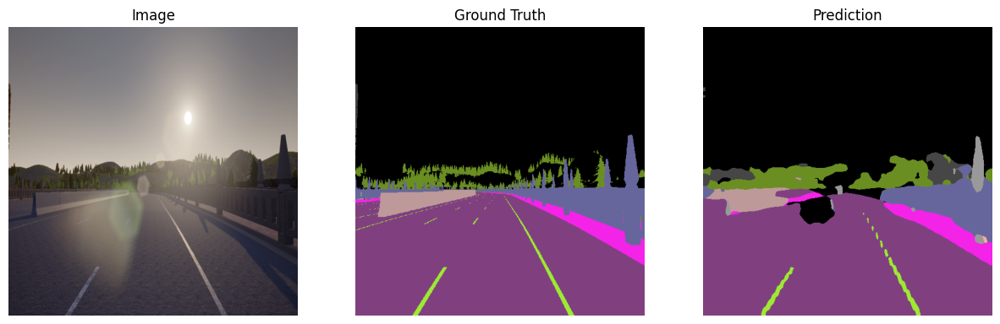

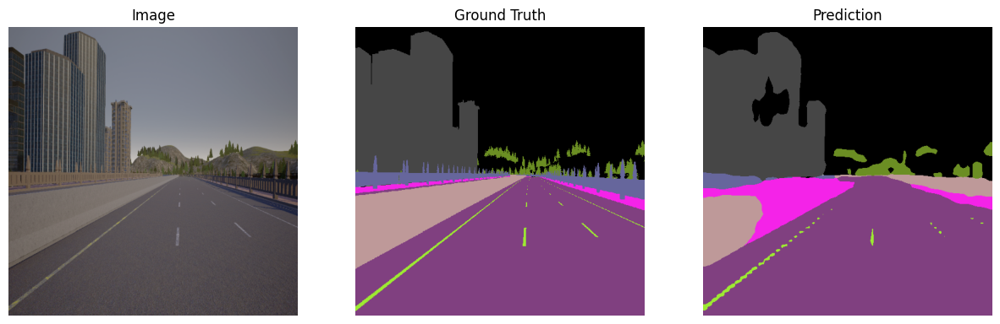

In [ ]:
# Get a batch
imgs, masks = next(iter(val_loader))
imgs_gpu = imgs.to(device)

with torch.no_grad():
    preds = model(imgs_gpu)["out"].argmax(1).cpu()

# Visualize the first 4 predictions
for i in range(4):
    visualize_prediction(imgs[i], masks[i], preds[i], COLORS)


If we compute the mIoU, we can observe a quite high mean (0.54), which indicates quite good performance of the model in segmentation. The classes that are less representative are the ones that obtain a lower IoU index, which makes sense due to the imbalance of the dataset.

In [ ]:
# Compute confusion matrix
cm = compute_confusion_matrix(model, val_loader, num_classes=14, device=device)

# Compute IoUs
ious = compute_ious_from_cm(cm)
miou = np.nanmean(ious)

# Print results
print("\nPer-class IoU:")
for i, iou in enumerate(ious):
    print(f"Class {i}: {iou:.4f}")

print(f"\nMean IoU (mIoU): {miou:.4f}")



Per-class IoU:
Class 0: 0.8567
Class 1: 0.8093
Class 2: 0.4679
Class 3: 0.3512
Class 4: 0.0000
Class 5: 0.1728
Class 6: 0.5518
Class 7: 0.9309
Class 8: 0.7292
Class 9: 0.8172
Class 10: 0.5377
Class 11: 0.4271
Class 12: 0.1488
Class 13: nan

Mean IoU (mIoU): 0.5231


### 5.3 FCN + ResNet50 + FocalLoss

Since the dataset is highly imbalanced, an effective way to deal with it is by adding Focal Loss as the loss criteria for the FCN. We will enforce the right classification of hard samples. Therefore, we will observe if we get any different outputs with this loss.
As done before, the backbone will be frozen to prevent overloading of processes to train the network again.

In [ ]:
# Loading again pretrained ResNet50

model = torchvision.models.segmentation.fcn_resnet50(
    weights=torchvision.models.segmentation.FCN_ResNet50_Weights.DEFAULT
)

# Modify classifier heads for 14 classes
model.classifier[4] = nn.Conv2d(512, 14, kernel_size=1)
model.aux_classifier[4] = nn.Conv2d(256, 14, kernel_size=1)

model = model.to(device)


As done before, the backbone is frozen to speed up training.

In [ ]:
# Freezing backbone
for p in model.backbone.parameters():
    p.requires_grad = False

print("Backbone frozen:", not any(p.requires_grad for p in model.backbone.parameters()))


Backbone frozen: True


This time, the criterion is changed to Focal Loss for multiclass classification.

In [ ]:
criterion = FocalLoss(mode="multiclass")

# I train only the unfrozen parameters (classifier + aux head)
trainable_params = [p for p in model.parameters() if p.requires_grad]

optimizer = torch.optim.Adam(trainable_params, lr=1e-4, weight_decay=1e-5)

scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)



We reuse the training and validation functions

In [ ]:
# Here we have the training loop with early stopping as before

if training:
  best_val_loss = float("inf")
  num_epochs = 10

  patience = 3
  no_improve_epochs = 0

  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):
      print(f"\nEPOCH {epoch+1}/{num_epochs}")

      train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
      val_loss   = validate(model, val_loader, criterion, device)

      scheduler.step()

      print(f"Train Loss: {train_loss:.4f}")
      print(f"Val Loss:   {val_loss:.4f}")

      train_losses.append(train_loss)
      val_losses.append(val_loss)

      torch.save(model.state_dict(), f"{root_models}/fcn_focal_latest.pt")

      if val_loss < best_val_loss:
          best_val_loss = val_loss
          torch.save(model.state_dict(), f"{root_models}/fcn_focal_best.pt")
          print(">> Best FCN (Focal Loss) model saved")
          no_improve_epochs = 0
      else:
          no_improve_epochs += 1
          print(f"No improvement for {no_improve_epochs} epoch(s).")

      if no_improve_epochs >= patience:
          print("\nEarly stopping triggered.")
          break

  torch.save(model.state_dict(), f"{root_models}/fcn_focal_final.pt")
  print("\nTraining complete. Saved fcn_focal_latest.pt, fcn_focal_best.pt, fcn_focal_final.pt")



EPOCH 1/10


Train Loss: 0.8918
Val Loss:   0.4610
>> Best FCN (Focal Loss) model saved

EPOCH 2/10


Train Loss: 0.3183
Val Loss:   0.2823
>> Best FCN (Focal Loss) model saved

EPOCH 3/10


Train Loss: 0.2270
Val Loss:   0.2469
>> Best FCN (Focal Loss) model saved

EPOCH 4/10


Train Loss: 0.1939
Val Loss:   0.2353
>> Best FCN (Focal Loss) model saved

EPOCH 5/10


Train Loss: 0.1788
Val Loss:   0.2251
>> Best FCN (Focal Loss) model saved

EPOCH 6/10


Train Loss: 0.1625
Val Loss:   0.2222
>> Best FCN (Focal Loss) model saved

EPOCH 7/10


Train Loss: 0.1584
Val Loss:   0.2124
>> Best FCN (Focal Loss) model saved

EPOCH 8/10


Train Loss: 0.1531
Val Loss:   0.2112
>> Best FCN (Focal Loss) model saved

EPOCH 9/10


Train Loss: 0.1501
Val Loss:   0.2095
>> Best FCN (Focal Loss) model saved

EPOCH 10/10


Train Loss: 0.1469
Val Loss:   0.2145
No improvement for 1 epoch(s).

Training complete. Saved fcn_focal_latest.pt, fcn_focal_best.pt, fcn_focal_final.pt


Below one can observe the training and validation losses

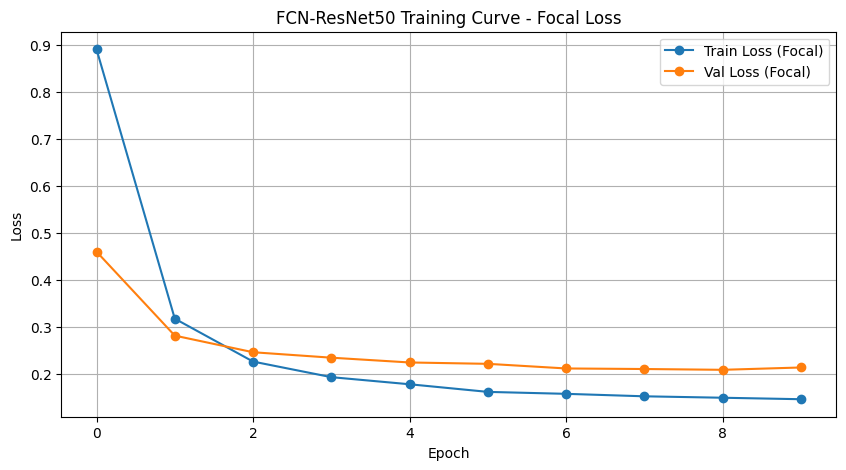

In [ ]:
if training:
    plt.figure(figsize=(10,5))
    plt.plot(train_losses, label="Train Loss (Focal)", marker='o')
    plt.plot(val_losses, label="Val Loss (Focal)", marker='o')
    plt.title("FCN-ResNet50 Training Curve - Focal Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.legend()
    plt.show()

Now the evaluation procedure with the model saved

In [ ]:
model = torchvision.models.segmentation.fcn_resnet50(
    weights=None,
    aux_loss=True

)

# Modifying classifier for 14 classes
model.classifier[4] = nn.Conv2d(512, 14, kernel_size=1)
model.aux_classifier[4] = nn.Conv2d(256, 14, kernel_size=1)

model = model.to(device)

# Freezinig again
for p in model.backbone.parameters():
    p.requires_grad = False


# Loading the trained weights

checkpoint_path = f"{root_models}/fcn_focal_best.pt"

state = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(state)

model.eval()

FCN(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

As observed in the displayed predictions below, the annotations seem to have a higher level of detail, being cautious with the details of the borders of the objects.

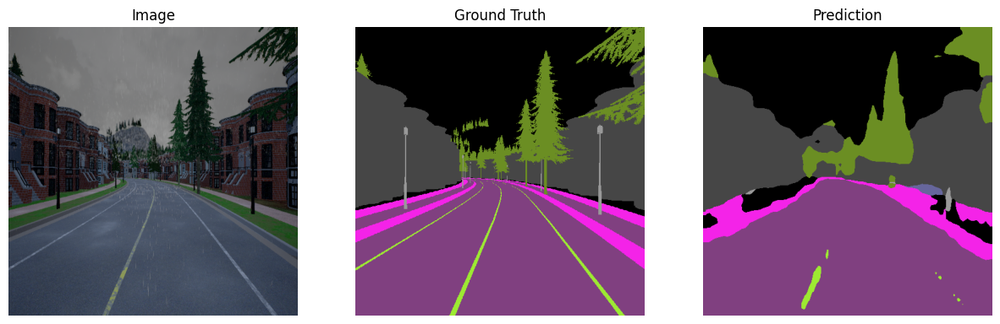

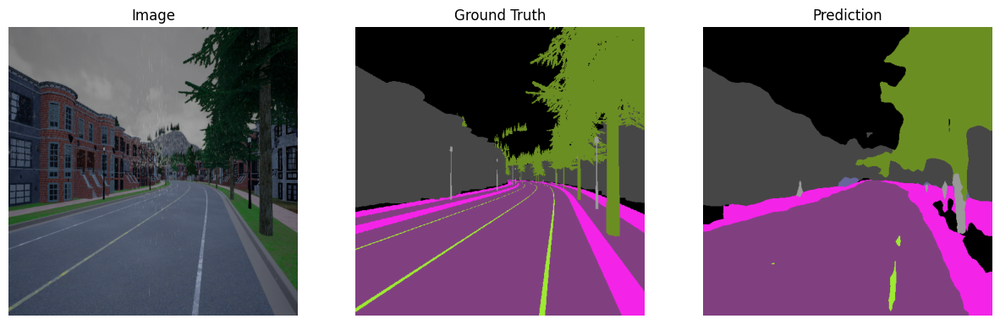

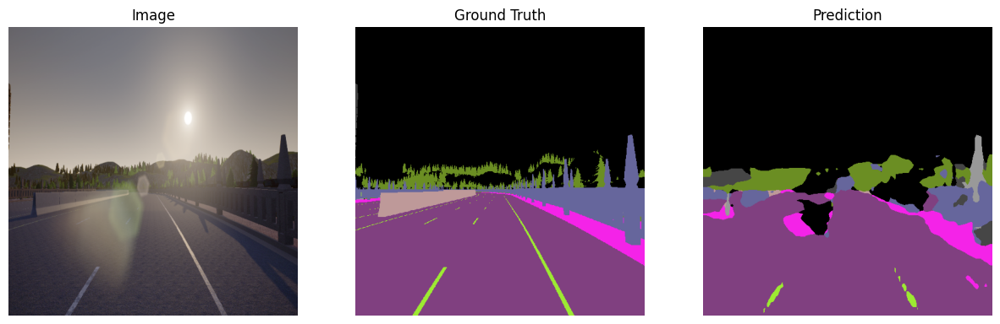

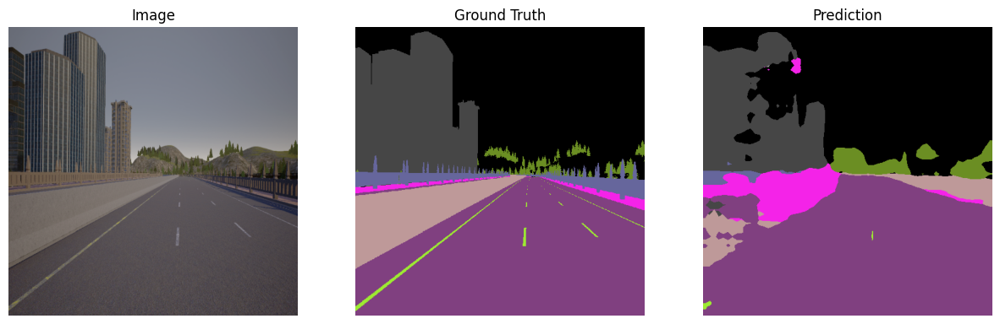

In [ ]:
imgs, masks = next(iter(val_loader))
imgs_gpu = imgs.to(device)

with torch.no_grad():
    preds = model(imgs_gpu)["out"].argmax(1).cpu()

for i in range(4):
    visualize_prediction(imgs[i], masks[i], preds[i], COLORS)

However, even if the images seem to be better segmented, the mean IoU is actually lower. Therefore, using focal loss is not optimal in this case.
Class weighting was tested but did not improve results either.

In [ ]:
cm = compute_confusion_matrix(model, val_loader, num_classes=14, device=device)
ious = compute_ious_from_cm(cm)
miou = np.nanmean(ious)

print("\nPer-class IoU:")
for i, iou in enumerate(ious):
    print(f"Class {i}: {iou:.4f}")

print(f"\nMean IoU (mIoU): {miou:.4f}")


Per-class IoU:
Class 0: 0.8375
Class 1: 0.7256
Class 2: 0.3492
Class 3: 0.0681
Class 4: 0.2300
Class 5: 0.0879
Class 6: 0.2332
Class 7: 0.8770
Class 8: 0.4815
Class 9: 0.7339
Class 10: 0.5093
Class 11: 0.3017
Class 12: 0.0478
Class 13: nan

Mean IoU (mIoU): 0.4217


### 5.3 U-Net

The following segmentation technique I will be using is a model based in U-Net. A U-Net has a encoder-decoder structure and its advantage is that it performs upscaling, being able to detect smaller features in the images and not lose high amounts of resolution due to striding. In the image below we can observe the architecture of the U-Net. U-Net is excelleng in accuracy on fine structures and lightweight compared to transformer models. However, it lacks multi-scale context modules.

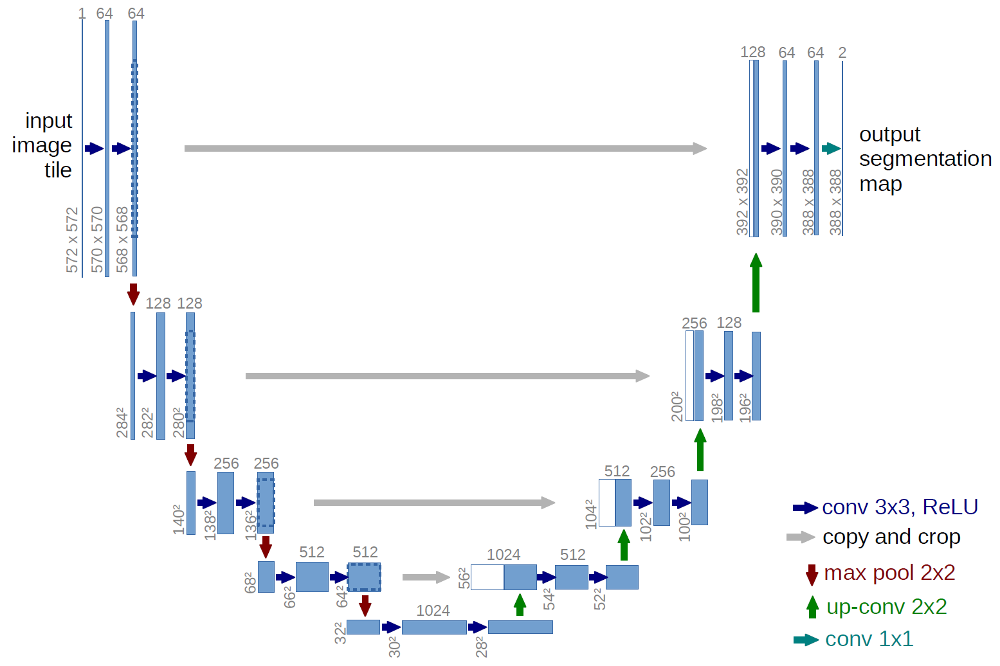

The first thing to do is to load the model. In this case I will use a ResNet34 as the preferred backbone. I changed from ResNet50 to ResNet34 to observe the changes in behaviour.

The encoder backbone will be frozen in order to save computational cost.

This time, the procedure will be the same as in the previous model trainings, therefore, I will keep all the training code together.

In [ ]:
# Creating U-Net (ResNet34 pretrained encoder)

if training:
  model = smp.Unet(
      encoder_name="resnet34",
      encoder_weights="imagenet",
      in_channels=3,
      classes=14
  )

  model = model.to(device)


  # Freezing encoder for all epochs.

  for param in model.encoder.parameters():
      param.requires_grad = False

  print("Encoder frozen:", not any(p.requires_grad for p in model.encoder.parameters()))


  # Defining the loss criterion, optimizer and scheduler

  criterion = nn.CrossEntropyLoss()

  trainable_params = [p for p in model.parameters() if p.requires_grad]

  optimizer = torch.optim.Adam(trainable_params, lr=1e-4, weight_decay=1e-5)
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)


  def train_one_epoch_unet(model, loader, optimizer, criterion, device):
    model.train()
    total_loss = 0

    for imgs, masks in tqdm(loader, desc="Training", leave=False):
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()

        outputs = model(imgs)  # <-- FIXED
        loss = criterion(outputs, masks)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    return total_loss / len(loader)

  def validate_unet(model, loader, criterion, device):
    model.eval()
    total_loss = 0

    with torch.no_grad():
        for imgs, masks in tqdm(loader, desc="Validating", leave=False):
            imgs = imgs.to(device)
            masks = masks.to(device)

            outputs = model(imgs)  # <-- FIXED
            loss = criterion(outputs, masks)

            total_loss += loss.item()

    return total_loss / len(loader)


  # Begin the train loop with early stopping

  best_val_loss = float("inf")
  num_epochs = 10

  # Early stopping
  patience = 3
  no_improve_epochs = 0

  # Loss lists
  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):
      print(f"\nEPOCH {epoch+1}/{num_epochs}")

      train_loss = train_one_epoch_unet(model, train_loader, optimizer, criterion, device)
      val_loss   = validate_unet(model, val_loader, criterion, device)

      scheduler.step()

      print(f"Train Loss: {train_loss:.4f}")
      print(f"Val Loss:   {val_loss:.4f}")

      # Save for plotting
      train_losses.append(train_loss)
      val_losses.append(val_loss)

      # Save latest
      torch.save(model.state_dict(), f"{root_models}/unet_latest.pt")

      # Save best
      if val_loss < best_val_loss:
          best_val_loss = val_loss
          torch.save(model.state_dict(), f"{root_models}/unet_best.pt")
          print("Best UNet model saved")

          no_improve_epochs = 0
      else:
          no_improve_epochs += 1
          print(f"No improvement for {no_improve_epochs} epoch(s).")

      # Early Stopping triggering

      if no_improve_epochs >= patience:

          print("\nEarly stopping triggered.")
          break


  torch.save(model.state_dict(), f"{root_models}/unet_final.pt")
  print("\nTraining complete. Saved: unet_latest.pt, unet_best.pt, unet_final.pt")

Encoder frozen: True

EPOCH 1/10


Train Loss: 1.6977
Val Loss:   1.1154
Best UNet model saved

EPOCH 2/10


Train Loss: 0.8418
Val Loss:   0.7376
Best UNet model saved

EPOCH 3/10


Train Loss: 0.5761
Val Loss:   0.6035
Best UNet model saved

EPOCH 4/10


Train Loss: 0.4577
Val Loss:   0.5515
Best UNet model saved

EPOCH 5/10


Train Loss: 0.3926
Val Loss:   0.5202
Best UNet model saved

EPOCH 6/10


Train Loss: 0.3452
Val Loss:   0.4865
Best UNet model saved

EPOCH 7/10


Train Loss: 0.3203
Val Loss:   0.4789
Best UNet model saved

EPOCH 8/10


Train Loss: 0.3091
Val Loss:   0.4644
Best UNet model saved

EPOCH 9/10


Train Loss: 0.2861
Val Loss:   0.4578
Best UNet model saved

EPOCH 10/10


Train Loss: 0.2685
Val Loss:   0.4505
Best UNet model saved

Training complete. Saved: unet_latest.pt, unet_best.pt, unet_final.pt


Plotting training and validation Loss

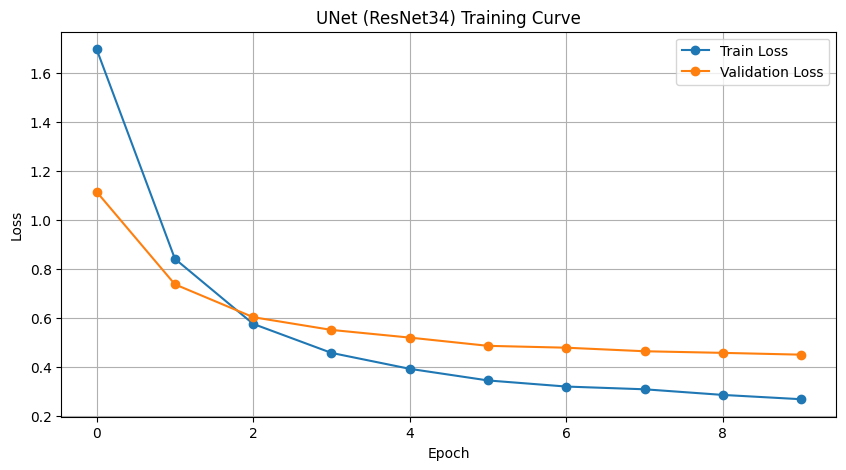

In [ ]:
if training:
  plt.figure(figsize=(10,5))
  plt.plot(train_losses, label="Train Loss", marker='o')
  plt.plot(val_losses, label="Validation Loss", marker='o')
  plt.title("UNet (ResNet34) Training Curve")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.grid(True)
  plt.legend()
  plt.show()

New computation for confusion matrix for the U-Net

In [ ]:
def compute_confusion_matrix_unet(model, loader, num_classes=14, device="cuda"):
    model.eval()
    cm = torch.zeros(num_classes, num_classes, dtype=torch.long, device=device)

    with torch.no_grad():
        for imgs, masks in loader:
            imgs = imgs.to(device)
            masks = masks.to(device).long()

            # SMP returns a tensor, NOT a dict
            preds = model(imgs).argmax(1)

            preds = preds.view(-1)
            masks = masks.view(-1)

            valid = (masks >= 0) & (masks < num_classes)

            inds = num_classes * masks[valid] + preds[valid]

            bc = torch.bincount(inds, minlength=num_classes**2)
            bc = bc.reshape(num_classes, num_classes)

            cm += bc

    return cm




Now we load the U-Net model and evaluate it

In [ ]:
model = smp.Unet(
    encoder_name="resnet34",
    encoder_weights=None,
    in_channels=3,
    classes=14
).to(device)

for p in model.encoder.parameters():
    p.requires_grad = False


# Load weights

checkpoint_path = f"{root_models}/unet_best.pt"
state = torch.load(checkpoint_path, map_location=device)
model.load_state_dict(state)

model.eval()
print("Model loaded correctly.")

Model loaded correctly.


In the visualizations below, we can observe quite detailed segmentation predictions. However, there are some blobs that should not be there.

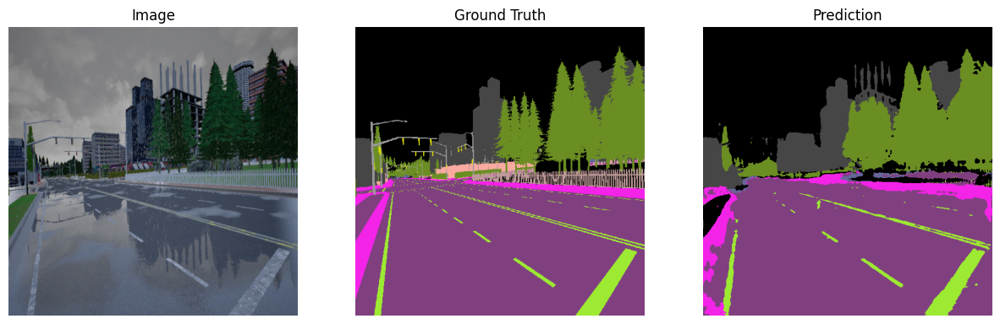

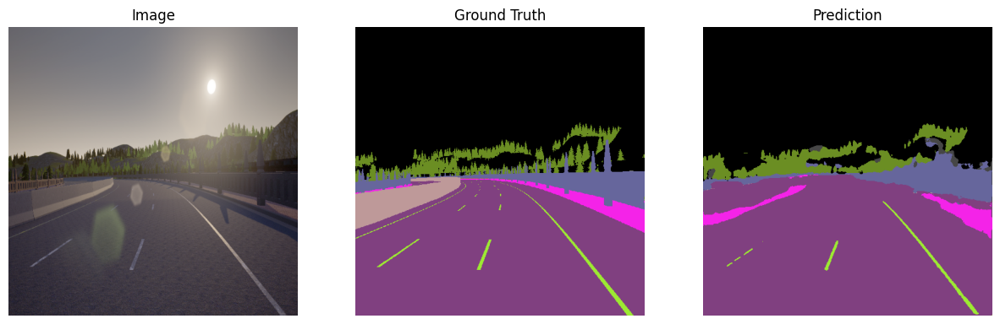

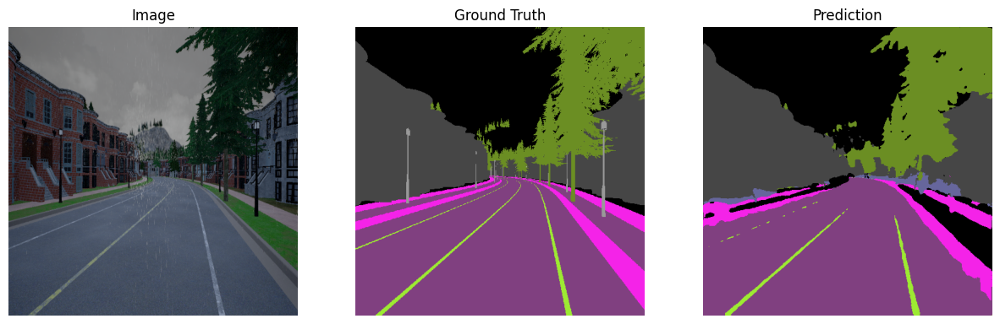

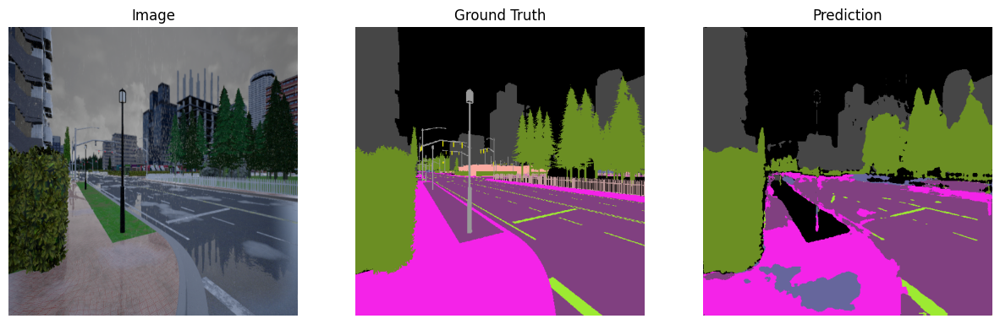

Predictions visualized.


In [ ]:
# Visualize Predictions

imgs, masks = next(iter(val_loader))
imgs_gpu = imgs.to(device)

with torch.no_grad():
    preds = model(imgs_gpu).argmax(1).cpu()

# Show first 4 samples
for i in range(4):
    visualize_prediction(imgs[i], masks[i], preds[i], COLORS)

print("Predictions visualized.")

As expected, the mIoU is not as high as needed. The U-Net model fails to segmentate in an optimal way compared to previous models.

In [ ]:
# Compute mIoU

cm = compute_confusion_matrix_unet(model, val_loader, num_classes=14, device=device)

ious = compute_ious_from_cm(cm)
miou = np.nanmean(ious)

print("\nPer-class IoU:")
for c, iou in enumerate(ious):
    print(f"Class {c}: {iou:.4f}")

print(f"\nMean IoU (mIoU): {miou:.4f}")
print("Evaluation complete.")


Per-class IoU:
Class 0: 0.8527
Class 1: 0.7630
Class 2: 0.0009
Class 3: 0.0000
Class 4: 0.0000
Class 5: 0.0000
Class 6: 0.6024
Class 7: 0.8813
Class 8: 0.5994
Class 9: 0.8056
Class 10: 0.0000
Class 11: 0.4343
Class 12: 0.0000
Class 13: nan

Mean IoU (mIoU): 0.3800
Evaluation complete.


### 5.4 DEEPLABV3+

DeeplabV3+ is a model which aims to improve segmentation accuracy on complex scenes. To do so, it enhances multi-scale context understanding, solving the multiple limitations FCN and U-Nets have. It provides quite sharp boundaries and robust segmentation in real-world data.

The core idea is the atrous convolutions used to control the feature density with different dilation rates. This allows to capture large scale context in an efficient way. It works as a very precise edge boundary detector.

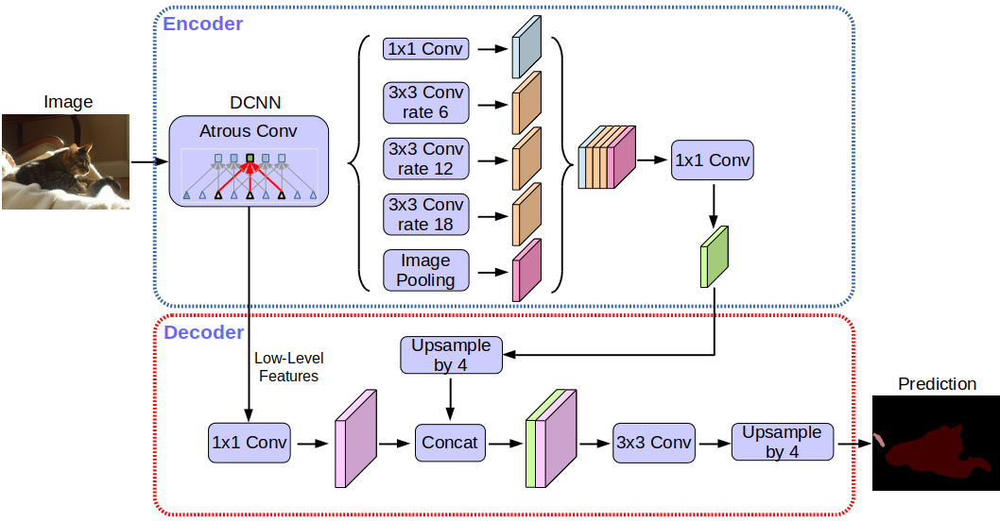

In the usual way, the model is trained by uploading the pretrained weights, freezing most layers and fine tuning the last layers. A ResNet50 backbone will be used, as it proved to be working well for the FCN.

In [ ]:

model = torchvision.models.segmentation.deeplabv3_resnet50(
    weights=torchvision.models.segmentation.DeepLabV3_ResNet50_Weights.DEFAULT
)

# Replace classifier head (21 to 14 classes)
model.classifier[4] = nn.Conv2d(256, 14, kernel_size=1)

model = model.to(device)

#Freezing backbone
for p in model.backbone.parameters():
    p.requires_grad = False

print("Backbone frozen:", not any(p.requires_grad for p in model.backbone.parameters()))

Downloading: "https://download.pytorch.org/models/deeplabv3_resnet50_coco-cd0a2569.pth" to /root/.cache/torch/hub/checkpoints/deeplabv3_resnet50_coco-cd0a2569.pth


100%|██████████| 161M/161M [00:00<00:00, 198MB/s]


Backbone frozen: True


I stick to the same losses criterions and optimizer I used for the other models to observe changes.

In [ ]:
# Defining loss, optimizer and scheduler

criterion = nn.CrossEntropyLoss()

trainable_params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.Adam(trainable_params, lr=1e-4, weight_decay=1e-5)
scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

In [ ]:
if training:

  best_val_loss = float("inf")
  num_epochs = 10

  # Early stopping settings
  patience = 3
  no_improve_epochs = 0

  # Loss lists for plotting
  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):
      print(f"\nEPOCH {epoch+1}/{num_epochs}")

      train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
      val_loss   = validate(model, val_loader, criterion, device)

      scheduler.step()

      print(f"Train Loss: {train_loss:.4f}")
      print(f"Val Loss:   {val_loss:.4f}")

      # Save losses
      train_losses.append(train_loss)
      val_losses.append(val_loss)

      # Save latest model
      torch.save(model.state_dict(), f"{root_models}/deeplab_latest.pt")

      # Save best model
      if val_loss < best_val_loss:
          best_val_loss = val_loss
          torch.save(model.state_dict(), f"{root_models}/deeplab_best.pt")
          print("Best DeepLab model saved")
          no_improve_epochs = 0
      else:
          no_improve_epochs += 1
          print(f"No improvement for {no_improve_epochs} epoch(s).")

      # Early stopping
      if no_improve_epochs >= patience:
          print("\nEarly stopping triggered.")
          break

  torch.save(model.state_dict(), f"{root_models}/deeplab_final.pt")

  print("\nTraining complete. Saved deeplab_latest.pt, deeplab_best.pt, deeplab_final.pt")


EPOCH 1/10


Train Loss: 1.0772
Val Loss:   0.7552
Best DeepLab model saved

EPOCH 2/10


Train Loss: 0.5613
Val Loss:   0.6030
Best DeepLab model saved

EPOCH 3/10


Train Loss: 0.4162
Val Loss:   0.5139
Best DeepLab model saved

EPOCH 4/10


Train Loss: 0.3440
Val Loss:   0.4888
Best DeepLab model saved

EPOCH 5/10


Train Loss: 0.2965
Val Loss:   0.4644
Best DeepLab model saved

EPOCH 6/10


Train Loss: 0.2664
Val Loss:   0.4524
Best DeepLab model saved

EPOCH 7/10


Train Loss: 0.2512
Val Loss:   0.4468
Best DeepLab model saved

EPOCH 8/10


Train Loss: 0.2378
Val Loss:   0.4465
Best DeepLab model saved

EPOCH 9/10


Train Loss: 0.2292
Val Loss:   0.4459
Best DeepLab model saved

EPOCH 10/10


Train Loss: 0.2203
Val Loss:   0.4444
Best DeepLab model saved

Training complete. Saved deeplab_latest.pt, deeplab_best.pt, deeplab_final.pt


The training and validation loss plot can be observed below. There is not overfitting.


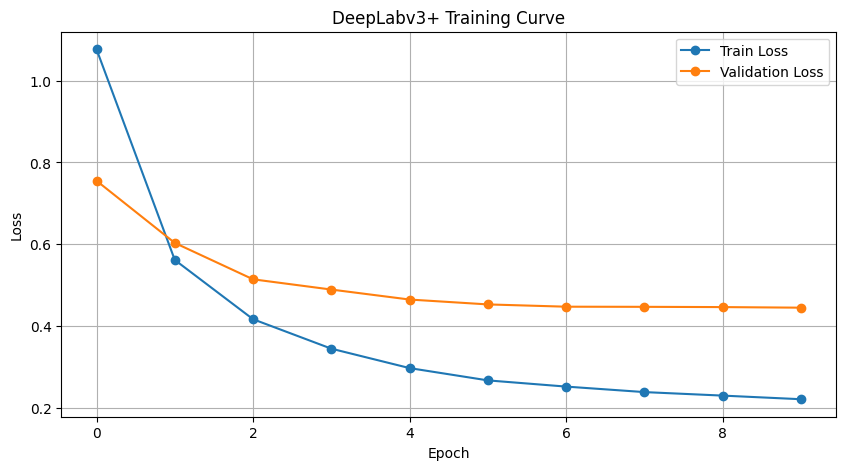

In [ ]:
if training:
  plt.figure(figsize=(10,5))
  plt.plot(train_losses, label="Train Loss", marker="o")
  plt.plot(val_losses, label="Validation Loss", marker="o")
  plt.title("DeepLabv3+ Training Curve")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.grid(True)
  plt.legend()
  plt.show()

Now we evaluate the model loading the pretrained weights

In [ ]:

model = torchvision.models.segmentation.deeplabv3_resnet50(
    weights=None,
)

# Replace classifier head for 14 classes
model.classifier[4] = torch.nn.Conv2d(256, 14, kernel_size=1)

# Move to device
model = model.to(device)



for p in model.backbone.parameters():
    p.requires_grad = False

print("Backbone frozen:", not any(p.requires_grad for p in model.backbone.parameters()))

state_dict = torch.load(f"{root_models}/deeplab_best.pt", map_location=device)
model.load_state_dict(state_dict, strict=False)

model.eval()

Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth


100%|██████████| 97.8M/97.8M [00:00<00:00, 112MB/s]


Backbone frozen: True


DeepLabV3(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Se

The predictions below seem to be way less detailed than the models explored beforehand. The frozen weights of the DeepLabV3+ model must not be accurate for this specific dataset

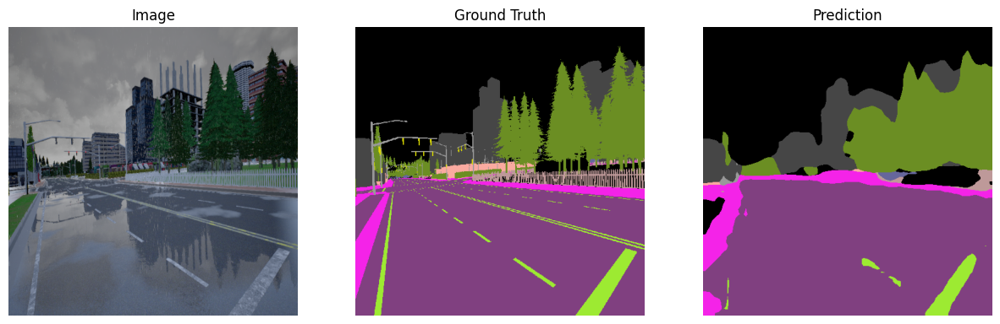

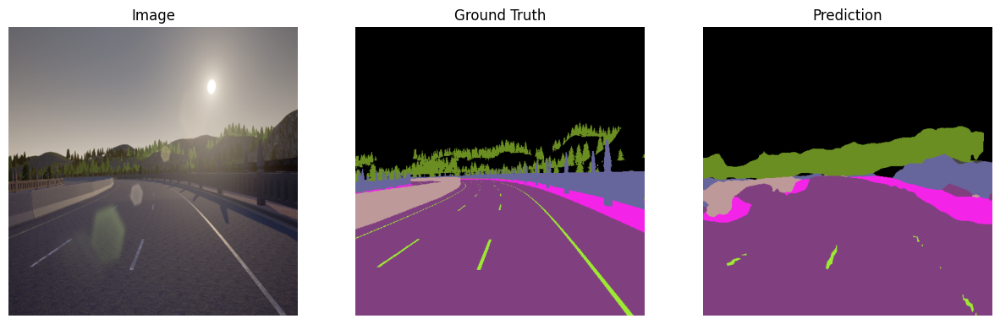

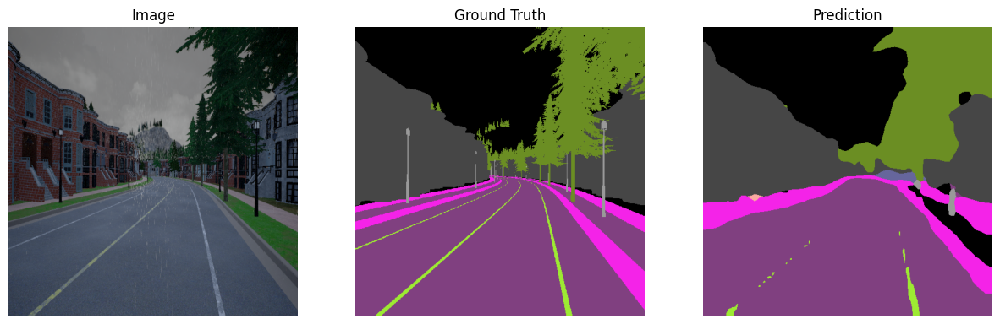

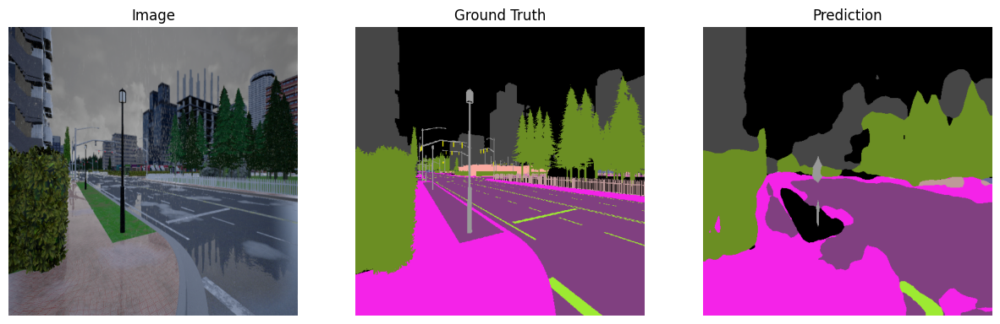


Predictions visualized.



In [ ]:
imgs, masks = next(iter(val_loader))
imgs_gpu = imgs.to(device)

with torch.no_grad():
    preds = model(imgs_gpu)["out"].argmax(1).cpu()

# Show first 4 samples
for i in range(4):
    visualize_prediction(imgs[i], masks[i], preds[i], COLORS)

print("\nPredictions visualized.\n")

As concluded with the images of the predictions, the mIoU is not as precise as expected. There are many classes that are not being well classified and have a score of 0.

In [ ]:

cm = compute_confusion_matrix(model, val_loader, num_classes=14, device=device)
cm_cpu = cm.cpu().numpy()

print("Confusion Matrix:")
print(cm_cpu)

# Computing mIoU

ious = compute_ious_from_cm(cm)
miou = np.nanmean(ious)

print("\nPer-class IoU:")
for i, iou in enumerate(ious):
    print(f"Class {i}: {iou:.4f}")

print(f"\nMean IoU (mIoU): {miou:.4f}")


Confusion Matrix:
[[40124846  1889312    79453     4813        0    87217        0    22782
    336388  1711871      319    91389        0        0]
 [  758891 18445108     3968    43141        0    66144        0     1266
    142097   854254     1101   264968        0        0]
 [  101289   153217  1245204     4557        0     2542        0  1092395
    566923    35243      115   158302        0        0]
 [   17457   544405      959   113494        0    12429        0      690
     46806    43866       57     6983        0        0]
 [      76      294        1      906        0      283        0     1538
       553      256        0       13        0        0]
 [  174671   381176     3562     9035        0   123043        0     5129
     45882   177468        8    18064        0        0]
 [   19444    58883     3004      264        0      934   689948  1249443
     55116    31188       53     1420        0        0]
 [ 1182637    37077    80998     3715        0    16189   220881 

### 5.5 SegFormer

The SegFormer model is a transformer-based implementation for segmentation without the use of CNNs. It avoids complex decoders and it has proven to be efficient for real time and resource limited settings. As it classifies pixel by pixel, it does not use positional encodings. Furthermore, it captures both global context and the fine details. However, transformers require large datasets for best performance and may find struggles if the training data is small.

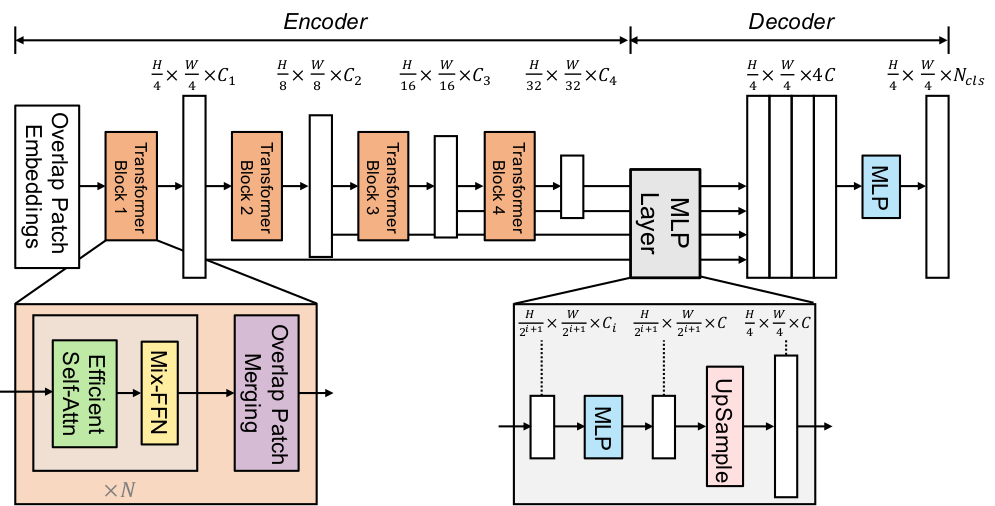

Once more, we begin the training process as described in the other models. This time, the training code will be quite different because here we use bilinear matching to select the correct class. This is based on the Hungarian Algorithm.

In [ ]:
if training:

  model = SegformerForSemanticSegmentation.from_pretrained(
      "nvidia/segformer-b0-finetuned-ade-512-512"
  )

  # Replace classifier head (ADE has 150 and I need 14)
  model.decode_head.classifier = nn.Conv2d(256, 14, kernel_size=1)

  # Remove auxiliary head
  model.auxiliary_head = None

  model = model.to(device)


  # freezing the decoder

  for p in model.segformer.encoder.parameters():
      p.requires_grad = False

  print("Backbone frozen:", not any(p.requires_grad for p in model.segformer.encoder.parameters()))


  # Loss, optimizer and scheduler

  criterion = nn.CrossEntropyLoss()

  trainable_params = [p for p in model.parameters() if p.requires_grad]
  optimizer = torch.optim.Adam(trainable_params, lr=1e-4, weight_decay=1e-5)
  scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)



  # Defining the training function, which this time is different due to the bilinear matching.

  def train_one_epoch(model, loader, optimizer, criterion, device):
      model.train()
      total_loss = 0

      for imgs, masks in tqdm(loader, desc="Training", leave=False):
          imgs = imgs.to(device)
          masks = masks.to(device)

          optimizer.zero_grad()

          outputs = model(imgs)

          # SegFormer outputs lower-res logits → upsample
          logits = torch.nn.functional.interpolate(
              outputs.logits,
              size=masks.shape[-2:],         # match target resolution
              mode="bilinear",
              align_corners=False
          )

          loss = criterion(logits, masks)
          loss.backward()
          optimizer.step()

          total_loss += loss.item()

      return total_loss / len(loader)



  # We validate the model

  def validate(model, loader, criterion, device):
      model.eval()
      total_loss = 0

      with torch.no_grad():
          for imgs, masks in tqdm(loader, desc="Validating", leave=False):
              imgs = imgs.to(device)
              masks = masks.to(device)

              outputs = model(imgs)

              logits = torch.nn.functional.interpolate(
                  outputs.logits,
                  size=masks.shape[-2:], mode="bilinear", align_corners=False
              )

              loss = criterion(logits, masks)
              total_loss += loss.item()

      return total_loss / len(loader)



  # Training Loop

  best_val_loss = float("inf")
  num_epochs = 10

  # Early stopping variables
  patience = 3
  no_improve_epochs = 0

  # For plotting later
  train_losses = []
  val_losses = []

  for epoch in range(num_epochs):
      print(f"\nEPOCH {epoch+1}/{num_epochs}")

      train_loss = train_one_epoch(model, train_loader, optimizer, criterion, device)
      val_loss   = validate(model, val_loader, criterion, device)

      scheduler.step()

      print(f"Train Loss: {train_loss:.4f}")
      print(f"Val Loss:   {val_loss:.4f}")

      train_losses.append(train_loss)
      val_losses.append(val_loss)

      # Save latest
      torch.save(model.state_dict(), f"{root_models}/segformer_latest.pt")

      # Save best
      if val_loss < best_val_loss:
          best_val_loss = val_loss
          torch.save(model.state_dict(), f"{root_models}/segformer_best.pt")
          print(">> Best SegFormer model saved")

          no_improve_epochs = 0  # reset
      else:
          no_improve_epochs += 1
          print(f"No improvement for {no_improve_epochs} epoch(s).")

      # Early Stopping
      if no_improve_epochs >= patience:
          print("\nEarly stopping triggered.")
          break


  torch.save(model.state_dict(), f"{root_models}/segformer_final.pt")

  print("\nTraining complete. Saved segformer_latest.pt, segformer_best.pt, segformer_final.pt")

config.json: 0.00B [00:00, ?B/s]

model.safetensors:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

Backbone frozen: True

EPOCH 1/10


Train Loss: 1.6822
Val Loss:   0.9103
>> Best SegFormer model saved

EPOCH 2/10


Train Loss: 0.8231
Val Loss:   0.6542
>> Best SegFormer model saved

EPOCH 3/10


Train Loss: 0.6417
Val Loss:   0.5850
>> Best SegFormer model saved

EPOCH 4/10


Train Loss: 0.5508
Val Loss:   0.5477
>> Best SegFormer model saved

EPOCH 5/10


Train Loss: 0.5053
Val Loss:   0.5229
>> Best SegFormer model saved

EPOCH 6/10


Train Loss: 0.4777
Val Loss:   0.5155
>> Best SegFormer model saved

EPOCH 7/10


Train Loss: 0.4681
Val Loss:   0.5099
>> Best SegFormer model saved

EPOCH 8/10


Train Loss: 0.4492
Val Loss:   0.5027
>> Best SegFormer model saved

EPOCH 9/10


Train Loss: 0.4364
Val Loss:   0.5012
>> Best SegFormer model saved

EPOCH 10/10


Train Loss: 0.4214
Val Loss:   0.4921
>> Best SegFormer model saved

Training complete. Saved segformer_latest.pt, segformer_best.pt, segformer_final.pt


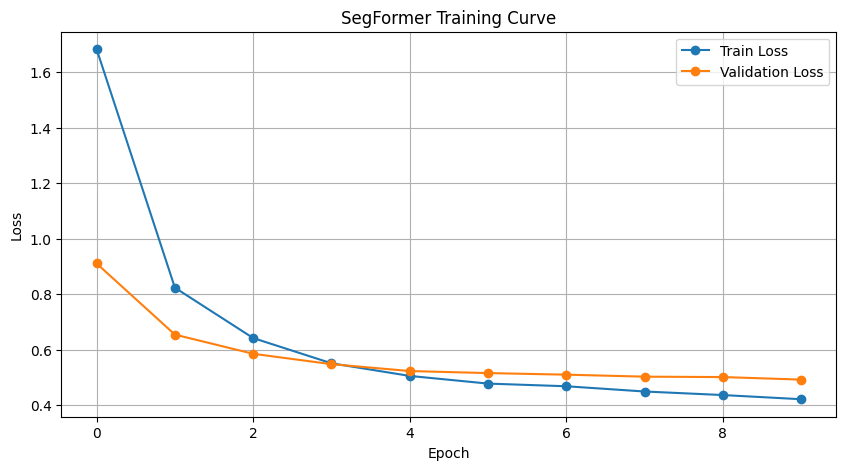

In [ ]:
if training:
  plt.figure(figsize=(10,5))
  plt.plot(train_losses, label="Train Loss", marker="o")
  plt.plot(val_losses, label="Validation Loss", marker="o")
  plt.title("SegFormer Training Curve")
  plt.xlabel("Epoch")
  plt.ylabel("Loss")
  plt.grid(True)
  plt.legend()
  plt.show()

Reload the SegFormer model to compute the evaluation metrics

In [ ]:
model = SegformerForSemanticSegmentation.from_pretrained(
    "nvidia/segformer-b0-finetuned-ade-512-512"
)

# Replace classifier head with 14 classes
model.decode_head.classifier = nn.Conv2d(256, 14, kernel_size=1)

# Remove auxiliary head
model.auxiliary_head = None

model = model.to(device)


# Freezing backbone

for p in model.segformer.encoder.parameters():
    p.requires_grad = False

print("Backbone frozen:", not any(p.requires_grad for p in model.segformer.encoder.parameters()))

state_dict = torch.load(f"{root_models}/segformer_best.pt", map_location=device)
model.load_state_dict(state_dict, strict=False)

model.eval()

Backbone frozen: True


SegformerForSemanticSegmentation(
  (segformer): SegformerModel(
    (encoder): SegformerEncoder(
      (patch_embeddings): ModuleList(
        (0): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(3, 32, kernel_size=(7, 7), stride=(4, 4), padding=(3, 3))
          (layer_norm): LayerNorm((32,), eps=1e-05, elementwise_affine=True)
        )
        (1): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((64,), eps=1e-05, elementwise_affine=True)
        )
        (2): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(64, 160, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((160,), eps=1e-05, elementwise_affine=True)
        )
        (3): SegformerOverlapPatchEmbeddings(
          (proj): Conv2d(160, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
          (layer_norm): LayerNorm((256,), eps=1e-05, elementwise_affine=True)
  

One would expect that this model performs better. However, as I explained before, we are working with a very little dataset, and transformers need a huge amount of data to perform correctly. The predictions are quite vague and the borders of the objects are not very detailed.

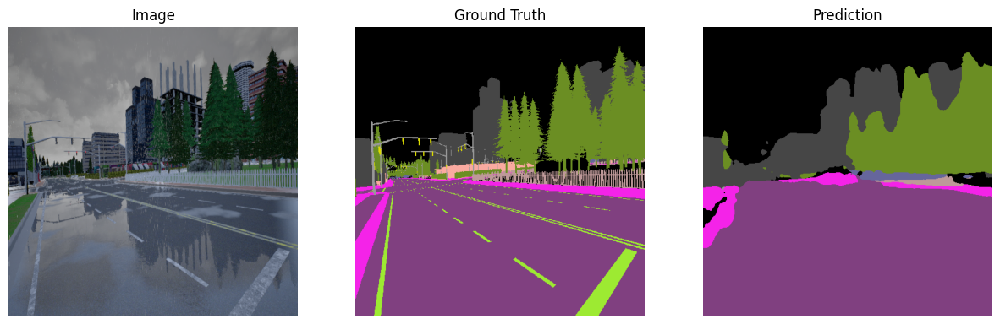

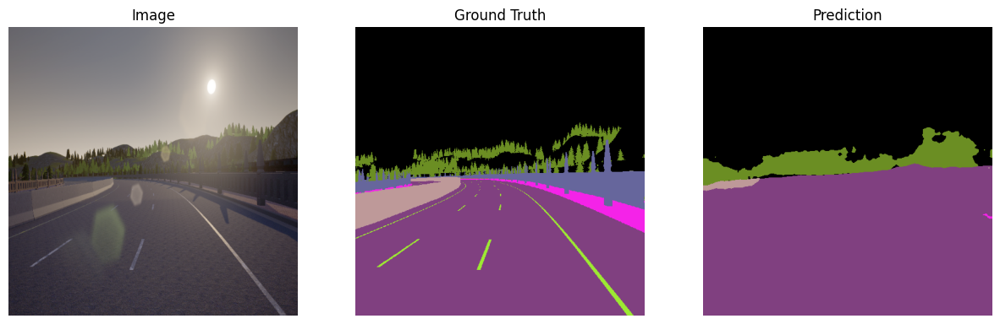

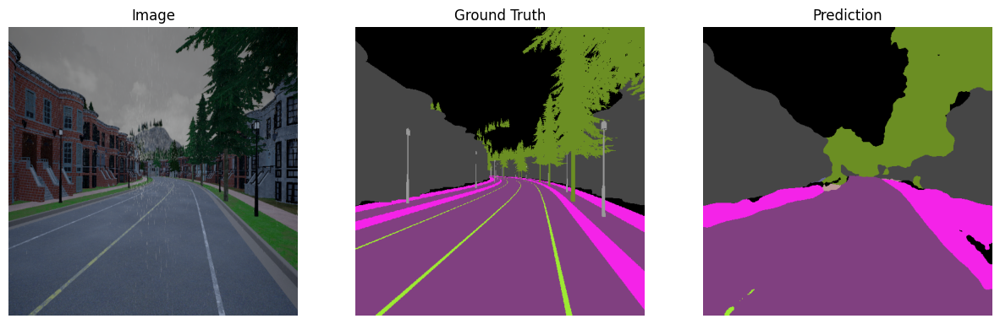

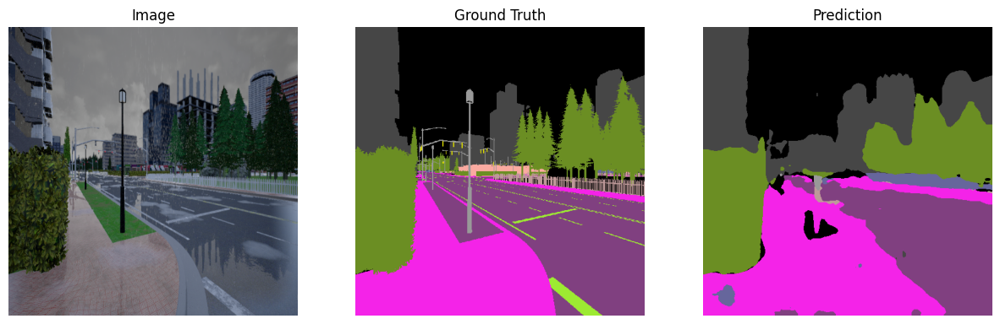


Predictions visualized.



In [ ]:
imgs, masks = next(iter(val_loader))
imgs_gpu = imgs.to(device)

with torch.no_grad():
    outputs = model(imgs_gpu)

    # logits are lower resolution: upsample to match GT mask
    logits = torch.nn.functional.interpolate(
        outputs.logits, size=masks.shape[-2:], mode="bilinear", align_corners=False
    )

    preds = logits.argmax(1).cpu()

# Show first 4 samples
for i in range(4):
    visualize_prediction(imgs[i], masks[i], preds[i], COLORS)

print("\nPredictions visualized.\n")

Computing the mean IoU. It is clearly lower than models tested beforehand and it completely fails to classify hard classes.
One must observe that SegFormer benefits from large scale pretraining and, therefore, results are not strictly comparable.

In [ ]:
def segformer_forward(model, imgs):
    """Helper so compute_confusion_matrix works unchanged."""
    outputs = model(imgs)
    logits = torch.nn.functional.interpolate(
        outputs.logits, size=imgs.shape[-2:], mode="bilinear", align_corners=False
    )
    return logits


def compute_confusion_matrix_segformer(model, loader, num_classes, device):
    model.eval()
    cm = torch.zeros(num_classes, num_classes, dtype=torch.long, device=device)

    with torch.no_grad():
        for imgs, masks in tqdm(loader, desc="Computing CM"):
            imgs = imgs.to(device)
            masks = masks.to(device).long()

            logits = segformer_forward(model, imgs)
            preds = logits.argmax(1)

            preds = preds.view(-1)
            masks = masks.view(-1)

            valid = (masks >= 0) & (masks < num_classes)
            inds = num_classes * masks[valid] + preds[valid]

            bc = torch.bincount(inds, minlength=num_classes*num_classes)
            cm += bc.reshape(num_classes, num_classes)

    return cm


cm = compute_confusion_matrix_segformer(model, val_loader, num_classes=14, device=device)
cm_cpu = cm.cpu().numpy()

print("Confusion Matrix:")
print(cm_cpu)


ious = compute_ious_from_cm(cm)
miou = np.nanmean(ious)

print("\nPer-class IoU:")
for i, iou in enumerate(ious):
    print(f"Class {i}: {iou:.4f}")

print(f"\nMean IoU (mIoU): {miou:.4f}")


Computing CM: 100%|██████████| 75/75 [00:33<00:00,  2.27it/s]

Confusion Matrix:
[[39830859  2255159    97900        0        0      924        0    28984
    315324  1768519        0    50721        0        0]
 [  310488 19463011     5759        0        0      255       23     6045
     79026   642885        0    73446        0        0]
 [  124587   219224   334149        0        0      393       34  1824424
    578789    51604        0   226583        0        0]
 [   36406   637441     1376        0        0      796        0      662
     35891    64286        0    10288        0        0]
 [      51      723       41        0        0      901        3      465
      1003      723        0       10        0        0]
 [  185724   470916     8641        0        0     6506        0     3087
     67398   192432        0     3334        0        0]
 [    6921    58990     2471        0        0      210    79501  1781692
    132471    44844        0     2597        0        0]
 [  450246    59673    57994        0        0     1899    22318 

## 6. ANOMALY EXPLORATION

Inside the test images, there are some strange elements that do not belong to any of the closed-set classes of the training data. These elements can be animals, foreign objects, debris, unusual vehicles... These anomalies belong to an open-set kind of problem where the models do not know what class do they belong to because it was not defined in the training set. We will have to test the models to see how well they perform finding these anomalies.

The first thing to do is to load the test data

In [41]:
test_transforms = A.Compose([
    A.Resize(512, 512),
])


In [42]:
test_set = StreetHazardsDataset(
    odgt_path=f"{root_test}/test.odgt",
    root_dir=root_test,
    transforms=test_transforms
)


They have the same characteristics as the training data, apart from the addition of the new class with index 13

In [43]:
print("Dataset size:", len(test_set))

img, mask = test_set[5]

print("Image shape:", img.shape)      # expected (3,H,W)
print("Mask shape:", mask.shape)      # expected (H,W)
print("Image dtype:", img.dtype)
print("Mask dtype:", mask.dtype)

print("Unique labels in mask:", torch.unique(mask))


Dataset size: 1500
Image shape: torch.Size([3, 512, 512])
Mask shape: torch.Size([512, 512])
Image dtype: torch.float32
Mask dtype: torch.int64
Unique labels in mask: tensor([ 0,  1,  2,  3,  5,  6,  7,  8,  9, 10, 11, 12, 13])


We work with a subset due to GPU limiations.

In [44]:
data_indices = random.sample(range(len(test_set)), 500)

# Create smaller subsets
test_set = Subset(test_set, data_indices)

Now I create the test data loader

In [45]:
test_loader = DataLoader(
    test_set,
    batch_size=4,
    shuffle=False,
    num_workers=2,
    pin_memory=True
)

print("Test samples:", len(test_set))


Test samples: 500


In [46]:
imgs, masks = next(iter(test_loader))
print(imgs.shape, masks.shape)
print(masks.min().item(), masks.max().item())


torch.Size([4, 3, 512, 512]) torch.Size([4, 512, 512])
0 13


As one can observe, int he image there is a vehicle that may not belong to any of the classes we were working with earlier. This is an anomaly.

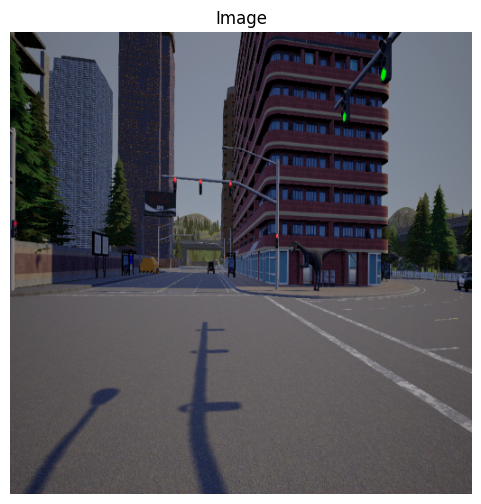

In [47]:
plt.figure(figsize=(6,6))
img_np = img.permute(1, 2, 0).cpu().numpy()   # (H, W, 3)
plt.imshow(img_np)
plt.title("Image")
plt.axis("off")
plt.show()


Let's display some annotations to observe how the anomaly class is defined. The anomalies are painted in light blue.

/tmp/ipython-input-1009605232.py:31: DeprecationWarning: 'mode' parameter is deprecated and will be removed in Pillow 13 (2026-10-15)
  return Image.fromarray(img_new.astype("uint8"), "RGB")


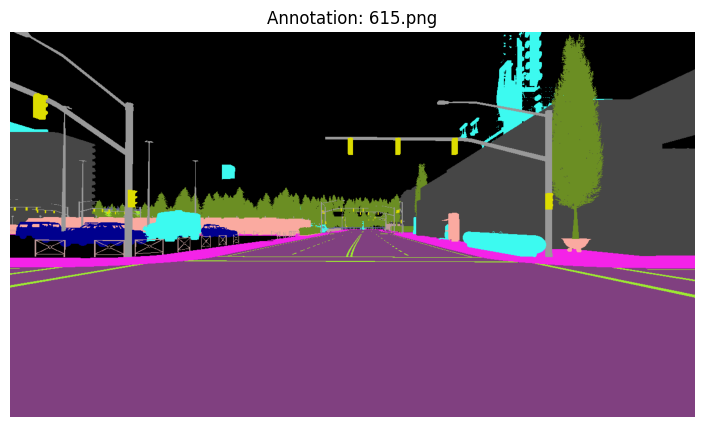

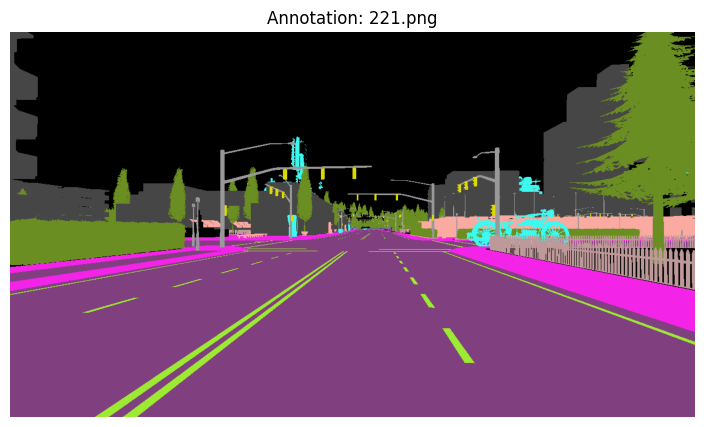

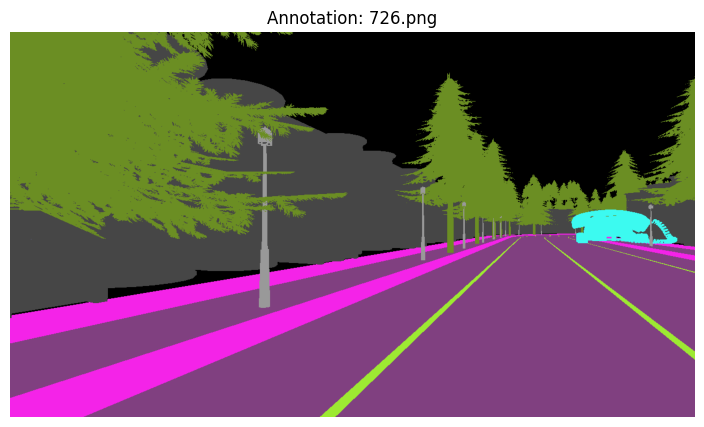

In [48]:
files = [f for f in os.listdir(TEST_ANNOTATIONS_FOLDER) if f.endswith(".png")]

# Pick 3 random masks
for f in random.sample(files, 3):
    annot_path = os.path.join(TEST_ANNOTATIONS_FOLDER, f)

    colored = color(annot_path, COLORS)

    plt.figure(figsize=(10, 5))
    plt.title(f"Annotation: {f}")
    plt.imshow(colored)
    plt.axis("off")
    plt.show()

Now we just highlight the anomalies to see them better.

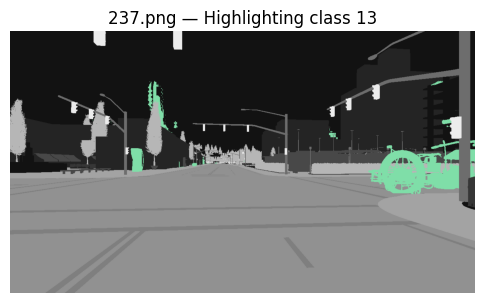

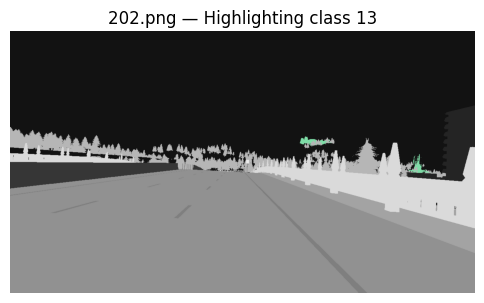

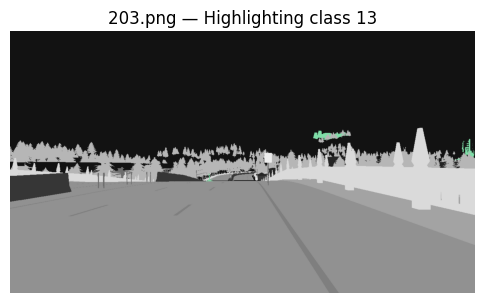

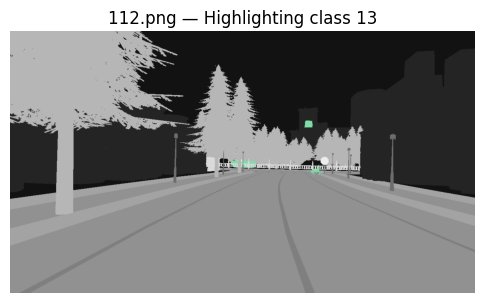

In [49]:
show_class_in_color(TEST_ANNOTATIONS_FOLDER, class_id=13, num_samples=4)

## 7. ANOMALY DETECTION

The models trained for the segmentation task must now be tested to see how well they perform on anomaly detection. To do so, we load the models from the previous section and measure some metrics of performance.

I will start measuring a naive baseline based on randomly decide what scores to give with no intelligent reasoning. This is just a sanity check and shows how a completely uninformed method performs in this dataset.

The metrics used are the following:
- MSP (Maximum Softmax Probability): Uses the model confidence as an anomaly score, which means that if we see low confidence it will likely be an anomaly. We first compute the softmax over the class logits and then take the max softmax value, which will be the confidence of the model. Finally, we se the anomaly score to be 1-max softmax probability.


- MaxLogit (Maximum Logit Value): Works in a similar way as MSP, but this time we take the raw logits. If we observe large logits, it will belong to a class, otherwise it will be an anomaly. For each pixel, we compute the max value across the class logits, and then set the anomaly score as -max logit

- SML (Softmax MaxLogit): This is a self-supervised mask learning, which combines softmax behavious with logit magnitude. It improves the separation between in-distribution and out-of-distribution pixels. It computes both the softmax confidence and max logit, and then applies normalization or transformation to fuse them into a better anomaly score.

AP metric will be computed for all these methods. Note AP/AUPR evaluate performance across all thresholds, avoiding the need to select a fixed threshold.

#### 7.1 Testing the Models

The following code loads each of the models and performes anomaly detection on the anomaly class with the methods I described before.

In [50]:
def load_unet():
    model = smp.Unet(
        encoder_name="resnet34",
        encoder_weights=None,
        in_channels=3,
        classes=14
    )
    model.load_state_dict(torch.load(f"{root_models}/unet_best.pt", map_location=device))
    return model.to(device).eval()


def load_fcn():
    model = torchvision.models.segmentation.fcn_resnet50(
        weights=None,
        aux_loss=True
    )
    model.classifier[4] = torch.nn.Conv2d(512, 14, 1)
    model.aux_classifier[4] = torch.nn.Conv2d(256, 14, 1)

    model.load_state_dict(
        torch.load(f"{root_models}/fcn_best.pt", map_location=device),
        strict=False
    )
    return model.to(device).eval()


def load_deeplab():
    model = torchvision.models.segmentation.deeplabv3_resnet50(
        weights=None
    )
    model.classifier[4] = torch.nn.Conv2d(256, 14, 1)

    model.load_state_dict(
        torch.load(f"{root_models}/deeplab_best.pt", map_location=device),
        strict=False
    )
    return model.to(device).eval()

def load_segformer():
    model = SegformerForSemanticSegmentation.from_pretrained(
        "nvidia/segformer-b0-finetuned-ade-512-512"
    )

    # Replace classifier to 14 classes
    model.decode_head.classifier = torch.nn.Conv2d(256, 14, kernel_size=1)

    # Remove auxiliary head
    model.auxiliary_head = None

    # Loading trained checkpoint
    model.load_state_dict(
        torch.load(f"{root_models}/segformer_best.pt", map_location=device),
        strict=False
    )

    return model.to(device).eval()


def get_logits(model, imgs):
    out = model(imgs)

    # SegFormer outputs logits at reduced spatial size: upsample
    if hasattr(out, "logits"):  # segformer
        logits = out.logits
        logits = torch.nn.functional.interpolate(
            logits,
            size=imgs.shape[-2:],  # match input resolution
            mode="bilinear",
            align_corners=False
        )
        return logits

    # FCN / DeepLab return dict
    if isinstance(out, dict):
        return out["out"]

    # UNet returns logits directly
    return out


Now evaluation needs to be done

In [51]:
def run_anomaly_evaluation(model_name):

    print(f" Running: {model_name.upper()}")

    # Loding the selected model

    if model_name == "unet":
        model = load_unet()
    elif model_name == "fcn":
        model = load_fcn()
    elif model_name == "deeplab":
        model = load_deeplab()
    elif model_name == "segformer":
        model = load_segformer()
    else:
        raise ValueError("Invalid model name")


    # Inference on the test set

    all_logits, all_msp, all_maxlogit, all_gt = [], [], [], []

    with torch.no_grad():
        for imgs, masks in tqdm(test_loader, desc=f"{model_name} TEST"):
            imgs = imgs.to(device)

            logits = get_logits(model, imgs)  # [B,14,H,W]
            softmax = torch.softmax(logits, dim=1)

            gt = masks.cpu().numpy()

            # MSP
            maxsm = softmax.max(1)[0].cpu().numpy()
            anomaly_msp = 1 - maxsm

            # MaxLogit
            maxlog = logits.max(1)[0].cpu().numpy()
            anomaly_mlog = -maxlog

            all_logits.append(logits.cpu().numpy())
            all_msp.append(anomaly_msp)
            all_maxlogit.append(anomaly_mlog)
            all_gt.append(gt)

    all_logits = np.concatenate(all_logits, axis=0)
    all_msp = np.concatenate(all_msp, axis=0)
    all_maxlogit = np.concatenate(all_maxlogit, axis=0)
    all_gt = np.concatenate(all_gt, axis=0)

    # anomaly = class 13
    gt_anomaly = (all_gt == 13).astype(np.uint8)
    gt_flat = gt_anomaly.flatten()


    #  We just use a random baseline

    random_scores = np.random.rand(len(gt_flat))
    ap_random = average_precision_score(gt_flat, random_scores)

    print("\n--- Naive Baseline ---")
    print(f"AP (Random Noise): {ap_random}")


    #  MSP & MaxLogit
    ap_msp = average_precision_score(gt_flat, all_msp.flatten())
    ap_maxlogit = average_precision_score(gt_flat, all_maxlogit.flatten())

    print("\n--- Baseline Methods ---")
    print("AP (MSP):      ", ap_msp)
    print("AP (MaxLogit): ", ap_maxlogit)


    #  SML statistics
    logit_means = np.zeros(13)
    logit_stds  = np.zeros(13)
    counts      = np.zeros(13)

    with torch.no_grad():
        for imgs, masks in tqdm(val_loader, desc=f"{model_name} VAL"):
            imgs = imgs.to(device)
            logits = get_logits(model, imgs).cpu().numpy()
            masks = masks.cpu().numpy()

            for c in range(13):
                mask_c = (masks == c)
                if mask_c.sum() > 0:
                    vals = logits[:, c][mask_c]
                    logit_means[c] += vals.mean()
                    logit_stds[c]  += vals.std()
                    counts[c]      += 1

    for c in range(13):
        if counts[c] > 0:
            logit_means[c] /= counts[c]
            logit_stds[c]  /= counts[c]


    #  SML Computation

    sml_scores = []

    for logits in tqdm(all_logits, desc=f"{model_name} SML"):
        logits = np.asarray(logits)
        if logits.ndim == 3:
            logits = logits[np.newaxis, ...]

        B, C, H, W = logits.shape
        maxcls = logits.argmax(1)
        maxlog = logits.max(1)

        for b in range(B):
            sml = np.zeros((H, W), dtype=np.float32)
            for c in range(13):
                m = logit_means[c]
                s = logit_stds[c] + 1e-6
                mask = (maxcls[b] == c)
                sml[mask] = - (maxlog[b][mask] - m) / s
            sml_scores.append(sml)

    sml_scores = np.stack(sml_scores, axis=0)

    ap_sml = average_precision_score(gt_flat, sml_scores.flatten())

    print("\n--- SML Method ---")
    print("AP (SML):      ", ap_sml)

    print(f"\n>>>> DONE: {model_name.upper()} <<<<\n")

    return {
        "AP_Random": ap_random,
        "AP_MSP": ap_msp,
        "AP_MaxLogit": ap_maxlogit,
        "AP_SML": ap_sml
    }


In [52]:
def compute_anomaly_scores(model, imgs):
    with torch.no_grad():
        logits = get_logits(model, imgs)          # tensor
        softmax = torch.softmax(logits, dim=1)    # tensor

        msp = 1 - softmax.max(1)[0]
        mlog = -logits.max(1)[0]

        # FORCE conversion to numpy
        msp_np = msp.detach().cpu().numpy()
        mlog_np = mlog.detach().cpu().numpy()
        logits_np = logits.detach().cpu().numpy()

        return msp_np, mlog_np, logits_np


In [53]:
def show_qualitative(model_name, img, gt_mask, msp, mlog):
    # Convert safely to numpy
    img_np = img.detach().cpu().permute(1,2,0).numpy()
    gt_binary = (gt_mask.detach().cpu().numpy() == 13).astype(np.uint8)

    plt.figure(figsize=(14, 6))

    plt.subplot(1,4,1)
    plt.imshow(img_np)
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,4,2)
    plt.imshow(gt_binary, cmap="gray")
    plt.title("GT Anomaly Mask (class 13)")
    plt.axis("off")

    plt.subplot(1,4,3)
    plt.imshow(msp, cmap="inferno")
    plt.title(f"{model_name} – MSP")
    plt.axis("off")

    plt.subplot(1,4,4)
    plt.imshow(mlog, cmap="inferno")
    plt.title(f"{model_name} – MaxLogit")
    plt.axis("off")

    plt.show()


In [63]:
sample_indices = [5, 10, 15, 22]

samples = []
for idx in sample_indices:
    img, mask = test_set[idx]
    samples.append((img, mask))


##### 7.1.1 FCN + ResNet50

The first model to be tested is the FCN with ResNet50 backbone and Cross Entropy loss, as we did not observe better performance in segmentation when using the Focal Loss.

I will just display the results for all the models and then compare them in the ablation study.

In [ ]:
results_fcn = run_anomaly_evaluation("fcn")


 Running: FCN


fcn TEST: 100%|██████████| 25/25 [00:10<00:00,  2.42it/s]



--- Naive Baseline ---
AP (Random Noise): 0.013406119344024258

--- Baseline Methods ---
AP (MSP):       0.09280831943436596
AP (MaxLogit):  0.12089479016049164


fcn SML: 100%|██████████| 100/100 [00:01<00:00, 59.00it/s]



--- SML Method ---
AP (SML):       0.0890009114941719

>>>> DONE: FCN <<<<



As a qualitative analysis, we can observe that the regions that the model describes as anomalies are actually mostly not correct.


 FCN Qualitative Results


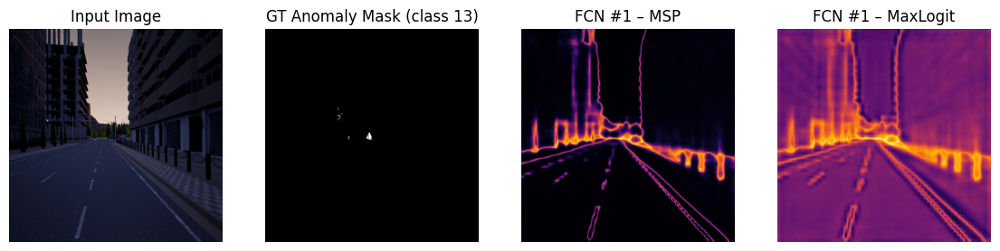

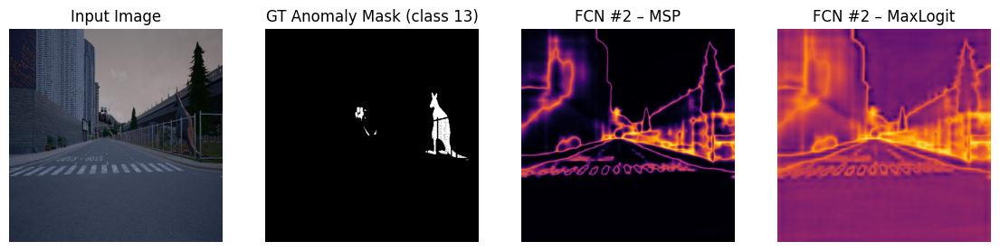

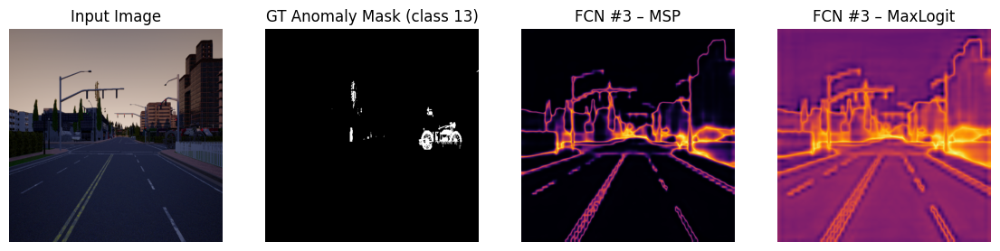

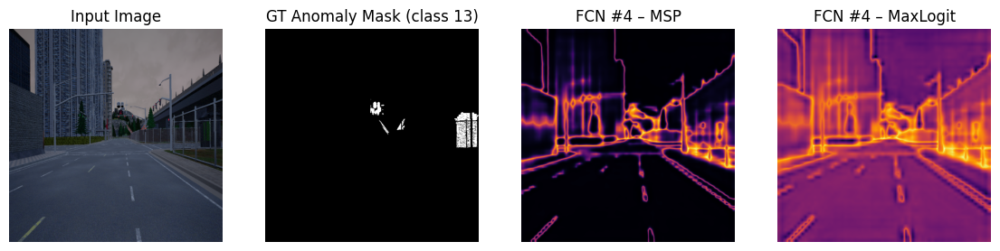

In [64]:
print("\n FCN Qualitative Results")

model_fcn = load_fcn()

for i, (sample_img, sample_mask) in enumerate(samples):

    img_batch = sample_img.unsqueeze(0).to(device)
    msp, mlog, _ = compute_anomaly_scores(model_fcn, img_batch)

    show_qualitative(
        model_name=f"FCN #{i+1}",
        img=sample_img,
        gt_mask=sample_mask,
        msp=msp[0],
        mlog=mlog[0]
    )


##### 7.1.2 U-Net

The U-Net failed to segment in a coherent way and we expect it to fail in the anomaly detection task.

In [ ]:
results_unet = run_anomaly_evaluation("unet")

 Running: UNET


unet TEST: 100%|██████████| 25/25 [01:34<00:00,  3.78s/it]



--- Naive Baseline ---
AP (Random Noise): 0.013436671377464238

--- Baseline Methods ---
AP (MSP):       0.09629390839742794
AP (MaxLogit):  0.07620829598303641


unet SML: 100%|██████████| 100/100 [00:01<00:00, 53.53it/s]



--- SML Method ---
AP (SML):       0.09493393139430972

>>>> DONE: UNET <<<<




 UNET Qualitative Results


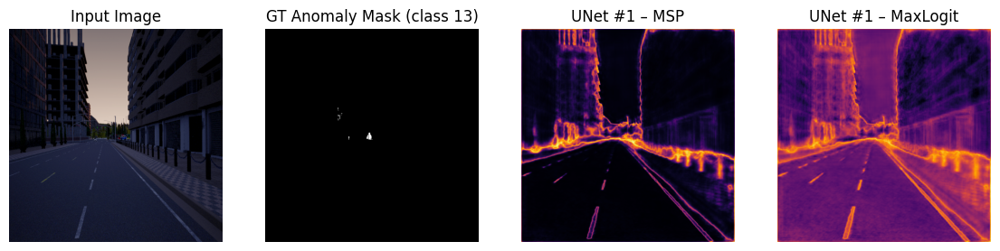

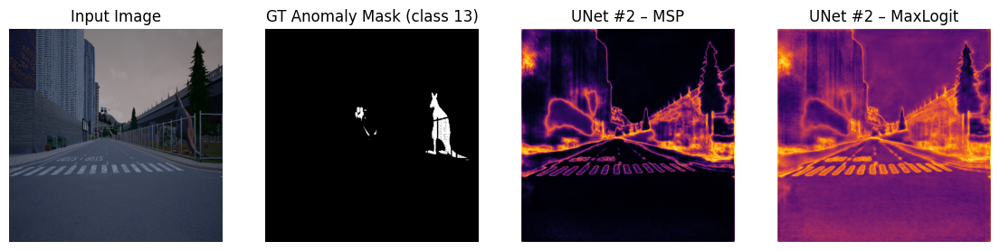

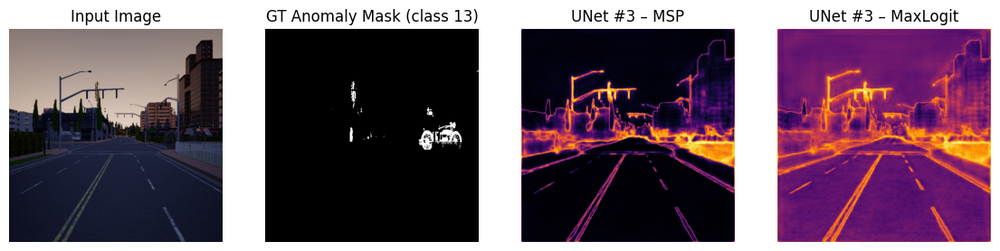

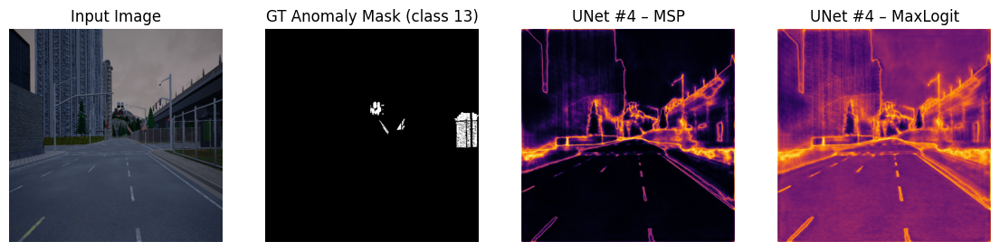

In [65]:
print("\n UNET Qualitative Results")
model_unet = load_unet()

for i, (sample_img, sample_mask) in enumerate(samples):
    img_batch = sample_img.unsqueeze(0).to(device)
    msp, mlog, _ = compute_anomaly_scores(model_unet, img_batch)

    show_qualitative(
        model_name=f"UNet #{i+1}",
        img=sample_img,
        gt_mask=sample_mask,
        msp=msp[0],
        mlog=mlog[0]
    )


##### 7.1.3 DeepLabV3+

DeepLabV3+ is such a powerful architecture that does not shine with such a small subset of the dataset we are working with. Therefore I don't expect great results.

In [ ]:

results_deeplab = run_anomaly_evaluation("deeplab")


 Running: DEEPLAB


deeplab TEST: 100%|██████████| 25/25 [00:13<00:00,  1.90it/s]



--- Naive Baseline ---
AP (Random Noise): 0.01337135478557719

--- Baseline Methods ---
AP (MSP):       0.09898005522271161
AP (MaxLogit):  0.11891032210042705


deeplab SML: 100%|██████████| 100/100 [00:01<00:00, 57.85it/s]



--- SML Method ---
AP (SML):       0.08511038687234769

>>>> DONE: DEEPLAB <<<<




 DeepLabV3+ Qualitative Results


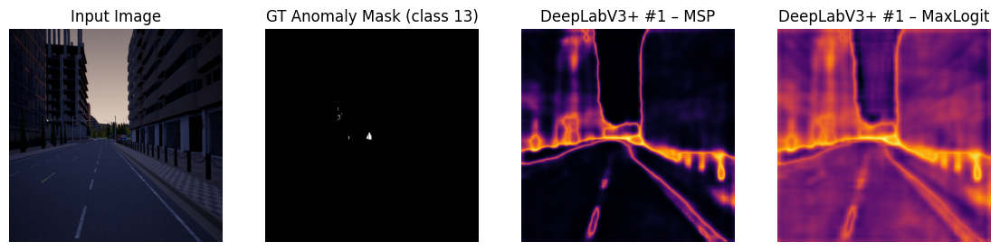

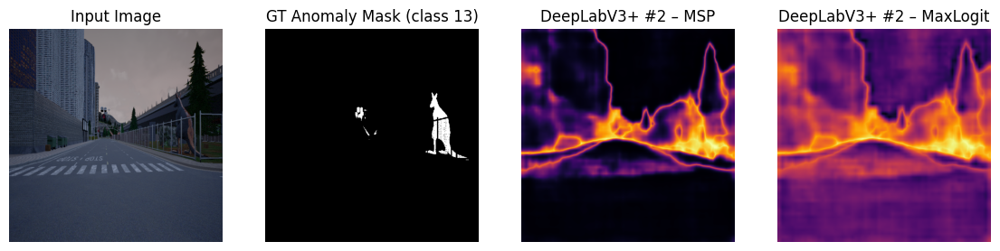

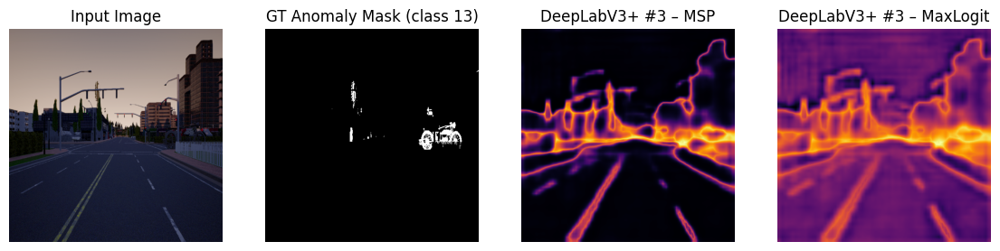

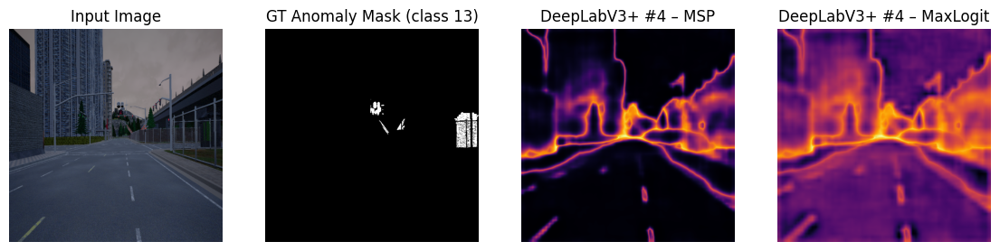

In [66]:
print("\n DeepLabV3+ Qualitative Results")
model_deeplab = load_deeplab()

for i, (sample_img, sample_mask) in enumerate(samples):
    img_batch = sample_img.unsqueeze(0).to(device)
    msp, mlog, _ = compute_anomaly_scores(model_deeplab, img_batch)

    show_qualitative(
        model_name=f"DeepLabV3+ #{i+1}",
        img=sample_img,
        gt_mask=sample_mask,
        msp=msp[0],
        mlog=mlog[0]
    )




##### 7.1.4 SegFormer

Finally, SegFormer has proven to be theoretically the best model for this kind of tasks. I expect it to outperform the other models, even if in the segmentation task it was not as precise as expected.

In [ ]:
results_segformer = run_anomaly_evaluation("segformer")

 Running: SEGFORMER


segformer TEST: 100%|██████████| 25/25 [00:09<00:00,  2.75it/s]



--- Naive Baseline ---
AP (Random Noise): 0.013416564650799713

--- Baseline Methods ---
AP (MSP):       0.10381297151279728
AP (MaxLogit):  0.15792056115450517


segformer SML: 100%|██████████| 100/100 [00:02<00:00, 38.27it/s]



--- SML Method ---
AP (SML):       0.12787870178057412

>>>> DONE: SEGFORMER <<<<




SegFormer Qualitative Results


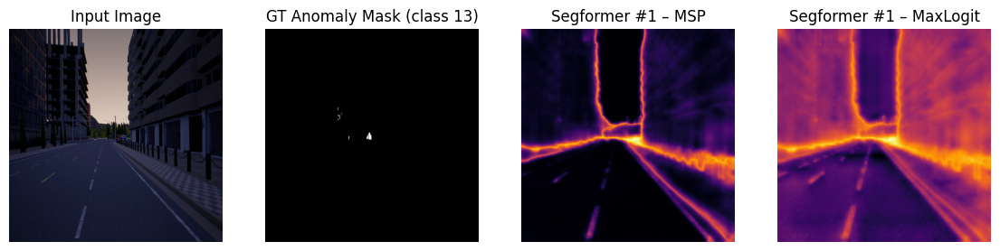

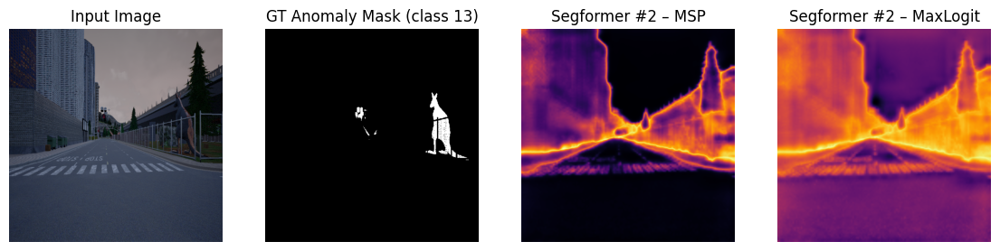

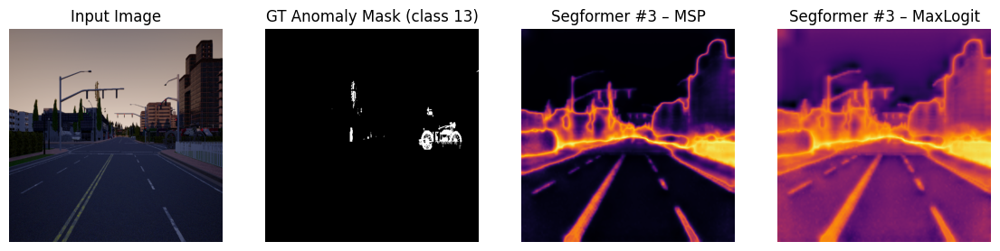

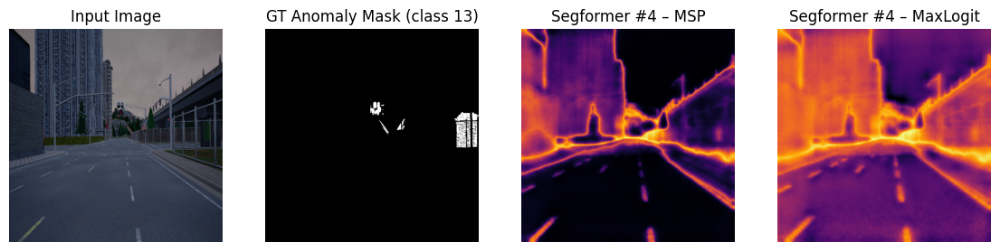

In [67]:
print("\nSegFormer Qualitative Results")
model_segformer = load_segformer()

for i, (sample_img, sample_mask) in enumerate(samples):
    img_batch = sample_img.unsqueeze(0).to(device)
    msp, mlog, _ = compute_anomaly_scores(model_segformer, img_batch)

    show_qualitative(
        model_name=f"Segformer #{i+1}",
        img=sample_img,
        gt_mask=sample_mask,
        msp=msp[0],
        mlog=mlog[0]
    )


#### 7.2 Qualitative Analysis of Anomaly Detection



The qualitative analysis is based in the pictures above, that show for each of the models tested: the original image, the ground truth of the anomalies, a heatmap for the MSP method and finally a heatmap for the MaxLogit.

The models are capable of identifying anomalies up to a certain point. Therefore, there are many other false positives, as can me observed in the heatmap. The heatmaps show in a bright orange color the regions where the model detects anomalies.

One can observe that both heatmaps mainly highlight the same areas. MSP tends to be more cautious and detects less anomalies, while MaxLogit has mostly orange areas. Since both heatmaps display mostly the same idea for the anomalies predicted, I will analyzed them together.

On the first picture, we can observe there are barely any anomalies, which we would expect that the heatmaps don't show any bright orange pixels. However, in most of the models we get false anomalies. The model that has the most wrong predictions in this image is the FCN one, and the most accurate is the SegFormer, just showing a bright dot on the small anomaly present.

Moving on to the second image, we can observe a big toy dinosaur that is clearly an anomaly. The model that correctly identify this anomaly is just DeepLabv3+. The rest of the models either have a big surface of anomaly around the area (SegFormer and UNet) or directly fail to spot the anomaly (FCN).

As a last example, in the third image, we can observe a motorcycle (or a similar vehicle) and the heatmap in the four models shows that it is being analyzed as an anomaly. However, a lot of other features in the image are also analyzed as an anomalies.




## 8. RESULTS

Most of the qualitative analysis has been made throughout the notebook. Therefore, I will now compare the models quantitatively. To have a more compact way to compare the different architectures explored, I provide the following tables. Note that, due to computational constraints, results are based on a single run.

#### 8.1 Global Segmentation Performance Summary (mIoU)

| Model                          | Backbone     | Params (M) | FLOPs (GFLOPs @ 512×512) | Train Time (min/epoch) | mIoU   |
|--------------------------------|--------------|------------|---------------------------|-------------------------|--------|
| **Naive Majority Class Baseline**    | –            | –          | –                         | –                       | 0.2600 |
| **FCN (ResNet50)**             | ResNet50     | 32.7       | 18                        | 1h 2 mins                    | 0.5231 |
| **FCN (ResNet50 + Focal Loss)**| ResNet50     | 32.7       | 18                        | 1 h 15 mins                   | 0.4217 |
| **UNet (ResNet34 Encoder)**    | ResNet34     | 22.0       | 25                        | 54 mins                    | 0.3800 |
| **DeepLabv3+**                 | ResNet50     | 41.1       | 62                        | 1h 34 mins                    | 0.4163 |
| **SegFormer (MiT-B0)**         | MiT-B0       | 3.8        | 8                         | 47 mins                    | 0.3046 |


Training Time and Efficiency Observations

- One can observe that FCN-ResNet50 has the best performance and computation tradeoff, with moderate FLOPs (18 GFLOPs) and the highest mIoU. Its simple decoder structure allows for faster training compared to UNet and DeepLab.

- FCN with Focal Loss actually trains at the same speed as vanilla FCN, because it has the same identical architecture, though convergence is slower due to the instability, which is introduced by the focal loss term.

- UNet (ResNet34) has more parameters than FCN but lower FLOPs than DeepLab. As shown before, it has a encoder-decoder designt that increases training time because of the upsampling, but it is still faster than most of the other models

- DeepLabv3+ is by far the most computationally expensive model with around 62 GFLOPs. This is due to the the ASPP module and decoder refinement. The training time is substantially higher but it does not trasnlate into a better performance.

- SegFormer-B0 has proven to be the most computationally efficient model, requiring only 3.8M parameters and 8 GFLOPs at 512×512 resolution.  Furthermore, it also trains the fastest per epoch.

- One can observe that, in general, training time correlates with FLOPs, but not parameter count.

- Finally, there is no clear linear relationship between training cost and segmentation accuracy. FCN has the best accuracy with medium computational cost, outperforming both the DeepLab and the efficient SegFormer.



Observations on Global Performance (mIoU)

- FCN-ResNet50 achieves the highest mIoU (0.5231). When comparing among all evaluated models, it demonstrates the strongest overall segmentation capability (the first task).

- DeepLabv3+ achieves the second-best mIoU (0.4163). It is a very strong architecture that benefits from its multi-scale ASPP module, though still falling noticeably behind FCN due to what I explained beforehand: a larger subset of data is needed to actually see precise results.

- Surprisingly, FCN with Focal Loss performs worse than the standard FCN (0.4217 vs. 0.5231).  
 One can conclude that the focal loss introduces training instability and does not help with this dataset’s class imbalance.

- UNet (0.3800) underperforms compared to FCN and DeepLab, which indicates that its heavy decoder architecture may not generalize well to rare objects or small details in the dataset.

- Totally unexpected, SegFormer-B0 obtains the lowest mIoU (0.3046).  
  Even if it is the most efficient, the encoder appears insufficient for complex semantic segmentation tasks without stronger regularization or a larger training set.

- Finally, the naive majority-class baseline (0.26 mIoU) shows us that all deep models learn meaningful representations and clearly outperform trivial solutions.

Per-Class IoU Comparison:

| Class | Label        | FCN-R50 | FCN-R50 + Focal | UNet  | DeepLabv3+ | SegFormer |
|-------|--------------|---------|------------------|--------|-------------|------------|
| **0** | Building     | 0.8567 | 0.8375 | 0.8527 | 0.8334 | 0.8457 |
| **1** | Fence        | 0.8093 | 0.7256 | 0.7630 | 0.7456 | 0.7453 |
| **2** | Other        | 0.4679 | 0.3492 | 0.0009 | 0.2575 | 0.0708 |
| **3** | Pedestrian   | 0.3512 | 0.0681 | 0.0000 | 0.1266 | 0.0000 |
| **4** | Pole         | 0.0000 | 0.2300 | 0.0000 | 0.0000 | 0.0000 |
| **5** | RoadLine     | 0.1728 | 0.0879 | 0.0000 | 0.0967 | 0.0069 |
| **6** | Road         | 0.5518 | 0.2332 | 0.6024 | 0.2956 | 0.0373 |
| **7** | Sidewalk     | 0.9309 | 0.8770 | 0.8813 | 0.8862 | 0.8549 |
| **8** | Vegetation   | 0.7292 | 0.4815 | 0.5994 | 0.5675 | 0.4377 |
| **9** | Car          | 0.8172 | 0.7339 | 0.8056 | 0.7355 | 0.7285 |
| **10**| Wall         | 0.5377 | 0.5093 | 0.0000 | 0.5515 | 0.0000 |
| **11**| TrafficSign  | 0.4271 | 0.3017 | 0.4343 | 0.3154 | 0.2326 |
| **12**| Background   | 0.1488 | 0.0478 | 0.0000 | 0.0000 | 0.0000 |


Observations on Per-Class IoU Performance

- As show in the table, in all models, classes 0, 1, 7, and 9 consistently achieve high IoUs, higher than 75%. By observing the labels we can see that these are the most common classes with very visually easy patterns.

- Most of the clases, which are small objects (2, 3, 4, 5, 10, 12) show extremely low IoUs in almost all models. In some models dropping to 0.0. It shows a high class imbalance and how difficult it is to segment minor categories and small objects.  

- Unexpectedly, FCN-ResNet50 shows the most balanced class performance. It achieves high IoUs in large classes, but maintaining quite reasonable performance on the less frequent classes.

- UNet has proven to collapse completely on many rare classes (class 2, 3, 4, 5, 10, 12). It obtaines IoU values of 0.0 for several categories. This is not an excellent performance since a model should be balanced when predicting all classes.  

- Thankfully, DeepLabv3+ improves over UNet on most classes, especially class 2, 3, 6, 10, and 11. This confirms the benefits of ASPP for multi scale representation.

- On the other hand, SegFormer-B0 performs quite well on large classes but struggles the most on not so frequent categories, matching its low overall mIoU. This model seems to not work well with low sets of training data.


#### 8.2 Anomaly Detection Results (AUPR/AP Scores)

| Model      | Random Noise | MSP        | MaxLogit    | SML         | Best Method |
|------------|--------------|------------|-------------|-------------|-------------|
| **UNet**       | 0.0134       | 0.0963     | 0.0762      | 0.0949      | MSP |
| **FCN**        | 0.0134       | 0.0928     | 0.1209      | 0.0890      | MaxLogit |
| **DeepLab**    | 0.0134       | 0.0990     | 0.1189      | 0.0851      | MaxLogit |
| **SegFormer**  | 0.0134       | 0.1038     | **0.1579**  | 0.1279      | MaxLogit |





Observations on Anomaly Detection Performance

- First of all, SegFormer achieves the best anomaly detection performance. It obtaines the highest AP with the MaxLogit method (AP = 0.1579). One can conclude that the transformer based encoder produce a stronger logit separation in between anomalous regions, even in we have seen that the mIoU is lower. This actually shows that mIoU may not be tied to anomaly detection performance, but rather to how well the model separates foreground and background uncertainty in the logit space.

- In the table we see that UNet performs best with MSP rather than MaxLogit. This quite deviates from typical open set behavior. We can infere that the decoder architecture produces softer or less calibrated logits, making MSP more stable because it reduces the discriminative power of MaxLogit.

- In the case of FCN and DeepLab, MaxLogit is the anomaly method that performes best. This is because these models use stronger residual backbones (ResNet50), which it has been proven that generate more confident activations for known classes. This makes logit separation more reliable.

- Furthermore, SML does not outperform MaxLogit or MSP in any model, even though it has competitive performance on UNet. SML benefits better of architectures with a smoother feature distribution.

- All in all, the models significantly outperform the naive random baseline (AP ≈ 0.013). Therefore, this confirms that even standard segmentation networks that are not mainly prepared for this task provide quite decent results in the anomaly detection procedure.


## 9. FINAL CONCLUSION

In conclusion, for the segmentation task we obtain higher performance with an apparently simpler and less advanced model such as FCN-ResNet50, while others that are almost the State of the Art fail to be as precise. This can be due also to the small subset of data I have worked with due to GPU limitations. Furthermore, the best anomaly detector has proven to be the SegFormer, based in a transformer architecture.

One must add that the mIoU of the best model (0.523) and AP of the best anomaly detection (0.1579) are very close results to the ones provided in the reference papers and in some cases outperforms those results. In a qualitative way, we can see that the models recognise the anomalies but fail to provide the complete silouette.


Overall, this project has allowed me in a magnificent way to understand the segmentation problem when applied to an open set. I have learnt how to create a complete computer vision pipeline and perform its corresponding ablation study. Furthermore, this topic has helped me understand the complexity of analizing images with a huge amount of different objects and how crucial it is for tasks such as automated driving.